# Extract all fitted params from many dates in OGA butler

- Author : Sylvie Dagoret-Campagne
- creation date : 2024-01-17
- last update : 2024-01-17
- affiliation : IJCLab/IN2P3/CNRS


## Imports

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import matplotlib.gridspec as gridspec
from spectractor.tools import from_lambda_to_colormap, wavelength_to_rgb
#%matplotlib widget 
import h5py
from scipy import interpolate
from astropy.time import Time

In [2]:
import spectractor
from spectractor.simulation.throughput import load_transmission,plot_transmission_simple,TelescopeTransmission
from spectractor import parameters
from spectractor.extractor import dispersers
from spectractor.config import load_config,set_logger
import os,sys

In [3]:
plt.rcParams["figure.figsize"] = (8,8)
plt.rcParams["axes.labelsize"] = 'xx-large'
plt.rcParams['axes.titlesize'] = 'xx-large'
plt.rcParams['xtick.labelsize']= 'xx-large'
plt.rcParams['ytick.labelsize']= 'xx-large'
plt.rcParams['legend.fontsize']=  12
plt.rcParams['font.size'] = 12

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
machine_name = os.uname().nodename
print(machine_name)
if 'sdf' in machine_name:
    #machine_name_usdf = 'sdfrome001'
    #machine_name_notebook platform = 'dagoret-nb'
    print("Set environement for USDF")
    newpythonpath = os.path.join(os.getenv("HOME"),"repos/repos_w_2023_44/rubinsimphot/src")
    sys.path.append(newpythonpath)
    newpythonpath = os.path.join(os.getenv("HOME"),"rubin-user/RubinLSSTPhotometricCorrTuto/notebooks/lib")
    sys.path.append(newpythonpath)   
elif "dagoret-nb" in machine_name:
    print("Set environement for Rubin Platform at  USDF")
    newpythonpath = os.path.join(os.getenv("HOME"),"repos/repos_w_2023_44/rubinsimphot/src")
    sys.path.append(newpythonpath)
    newpythonpath = os.path.join(os.getenv("HOME"),"rubin-user/RubinLSSTPhotometricCorrTuto/notebooks/lib")
    sys.path.append(newpythonpath)
elif 'mac' in machine_name:
    print("Be sure to run this notebook in conda environnement named conda_py310")
else:
    print("Your current machine name is {machine_name}. Check your python environment")

dagoret-nb
Set environement for Rubin Platform at  USDF


In [6]:
sys.path.append("../lib")
from libanaspectra import *

In [7]:
from rubinsimphot.phot_utils import Bandpass, Sed
from rubinsimphot.data.data_sets import  get_data_dir

#README.md        darksky.dat      filter_r.dat     hardware_g.dat   hardware_y.dat   lens3.dat        total_g.dat      total_y.dat
#README_SOURCE.md detector.dat     filter_u.dat     hardware_i.dat   hardware_z.dat   m1.dat           total_i.dat      total_z.dat
#atmos_10.dat     filter_g.dat     filter_y.dat     hardware_r.dat   lens1.dat        m2.dat           total_r.dat      version_info
#atmos_std.dat    filter_i.dat     filter_z.dat     hardware_u.dat   lens2.dat        m3.dat           total_u.dat
hardware_filenames = ["hardware_u.dat","hardware_g.dat","hardware_r.dat","hardware_i.dat","hardware_z.dat","hardware_y.dat"] 
filter_filenames = ["filter_u.dat","filter_g.dat","filter_r.dat","filter_i.dat","filter_z.dat","filter_y.dat" ]
total_filenames = ["total_u.dat","total_g.dat","total_r.dat","total_i.dat","total_z.dat","total_y.dat" ]
filter_tagnames = ["u","g","r","i","z","y"]
Filter_tagnames = ["U","G","R","I","Z","Y"]
filtercolor_tagnames = ["u-g","g-r","r-i","i-z","z-y"]
Filtercolor_tagnames = ["U-G","G-R","R-I","I-Y","Z-Y"]
filter_color = ["b","g","r","orange","grey","k"]
NFILT=len(filter_filenames)

WLMIN=300.
WLMAX=1100.
WLBIN=1.
NWLBIN=int((WLMAX-WLMIN)/WLBIN)
WL=np.linspace(WLMIN,WLMAX,NWLBIN)

In [8]:
#FILTERWL: precalculated array containing center, boundaries and width of each filter.
#index 0 : minimum wavelength of filter border
#index 1 : minimum wavelength of filter border
#index 2 : center wavelength of filter
#index 3 : filter width


FILTERWL = np.array([[ 324.03003755,  402.12765957,  363.59690349,   78.09762203],
       [ 392.11514393,  561.32665832,  473.54069923,  169.21151439],
       [ 542.3028786 ,  700.50062578,  619.49926767,  158.19774718],
       [ 681.47684606,  827.65957447,  752.01084117,  146.18272841],
       [ 808.63579474,  932.79098874,  868.488419  ,  124.15519399],
       [ 914.76846058, 1044.93116395,  969.10570859,  130.16270338]])

FILTERWL_auxtel = np.array([[ 352.7 ,  395.9 ,  374.3 ,   43.2 ],
                     [ 387.6 ,  566.2 ,  476.9 ,  178.6 ],
                     [ 541.4 ,  715.5 ,  628.45,  174.1 ],
                     [ 673.3 ,  870.9 ,  772.1 ,  197.6 ],
                     [ 805.6 , 1090.7 ,  948.15,  285.1 ]])


F0 = 3631.0 # Jy 1, Jy = 10^{-23} erg.cm^{-2}.s^{-1}.Hz^{-1}
Jy_to_ergcmm2sm1hzm1 = 1e-23
DT = 30.0 # seconds
gel = 1.1
#hP = 6.62607015E-34 # J⋅Hz−1
hP = 6.626196E-27
A  = np.pi*642.3**2 # cm2  Reff=6.423 m
A_auxtel  = 9636.0 # cm2

#ZPT_cont =  2.5 \log_{10} \left(\frac{F_0 A \Delta T}{g_{el} h} \right)
ZPTconst = 2.5*np.log10(F0*Jy_to_ergcmm2sm1hzm1*A*DT/gel/hP)

In [9]:
fdir = get_data_dir()
bandpass_inst = {}
path_rubin_sim_throughput = os.path.join(fdir, 'throughputs', 'baseline')
for index,filename in enumerate(hardware_filenames):
    fullfilename=os.path.join(path_rubin_sim_throughput,filename)
    arr= np.loadtxt(fullfilename)
    # interpolate  filter transmission
    ff = interpolate.interp1d(x=arr[:,0], y=arr[:,1],fill_value="extrapolate")
    fname = filter_tagnames[index]
    bandpass_inst[fname] = Bandpass(wavelen=WL,sb=ff(WL))

In [10]:
fig, axs = plt.subplots(1,1,figsize=(6,4))
# loop on filter
for index,f in enumerate(filter_tagnames):
    
    axs.plot(WL,bandpass_inst[f].sb,color=filter_color[index]) 
    axs.fill_between(WL,bandpass_inst[f].sb,color=filter_color[index],alpha=0.2) 
    axs.axvline(FILTERWL[index,2],color=filter_color[index],linestyle="-.")
    
axs.set_xlabel("$\\lambda$ (nm)")
axs.set_title("Total Rubin-LSST filter throughput")

Text(0.5, 1.0, 'Total Rubin-LSST filter throughput')

In [11]:
#from lsst.summit.utils.utils import checkStackSetup
#checkStackSetup()

In [12]:
import lsst.daf.butler as dafButler

repo = "/repo/main"
repo = "/repo/embargo"
# repo = "LATISS"
butler = dafButler.Butler(repo)
registry = butler.registry

for c in sorted(registry.queryCollections()):
    #if "u/jneveu" in c and "auxtel_atmo" in c:
    #if "u/dagoret" in c:
    if "u/dagoret" in c and "auxtel_atmo" in c:
        print(c)

u/dagoret/auxtel_atmo_202101_v3.0.3_doGainsPTC_rebin2_231208
u/dagoret/auxtel_atmo_202101_v3.0.3_doGainsPTC_rebin2_231208/20231220T142452Z
u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221
u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221/20231221T125249Z
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208/20231208T215202Z
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208
u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208/20231208T211104Z
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2/20231208T100936Z
u/dagoret/auxtel_atmosphere_202301_v3.0.3_doGainsPTC_rebin2/20231208T130352Z


## Config

### Config collection

In [13]:
#my_collection = "u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsPTC_rebin2_231208"
#my_collection = "u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208"

# all spectra from September 2022 to december 2023
#the reconstruction done by  LambdaMin = 350.0 and spectractor v3.0.3 in 2023/12/21

my_collection = "u/dagoret/auxtel_atmo_202209_v3.0.3_doGainsPTC_rebin2_231221"
#my_collection = "u/dagoret/auxtel_atmo_202301_v3.0.3_doGainsNOPTC_rebin2_231208"

### Config Auxtel

In [14]:
#config_path = "~/repos/repos_w_2023_44/Spectractor/config/auxtel.ini"
#config_path = "/home/d/dagoret/repos/repos_w_2023_44/Spectractor/config/auxtel.ini"
config_fullpath = os.path.join(spectractor.__path__[0],"../config/auxtel.ini")
throughput_filename="multispectra_holo4_003_HD142331_20230802_AuxTel_doGainsPTC_v3.0.3_throughput.txt"

In [15]:
load_config(config_fullpath)

### Config Telescope Throughtput

In [16]:
throughput_fullpath = os.path.join(spectractor.__path__[0],parameters.THROUGHPUT_DIR)
throughput_fullfilename = os.path.join(throughput_fullpath,throughput_filename)

In [17]:
tel_lambdas, tel_thr, tel_errthr = load_transmission(throughput_fullfilename) 

In [18]:
parameters.THROUGHPUT_DIR = throughput_fullpath 
parameters.OBS_FULL_INSTRUMENT_TRANSMISSON = throughput_filename
print(parameters.THROUGHPUT_DIR )
print(parameters.OBS_FULL_INSTRUMENT_TRANSMISSON)

/home/d/dagoret/repos/repos_w_2023_44/Spectractor/lib/python/spectractor/simulation/AuxTelThroughput/
multispectra_holo4_003_HD142331_20230802_AuxTel_doGainsPTC_v3.0.3_throughput.txt


In [19]:
%matplotlib inline
tel = TelescopeTransmission()
tel.plot_transmission()

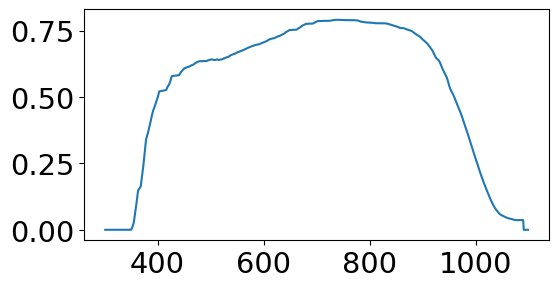

In [20]:
%matplotlib inline
fig = plt.figure(figsize=(6,3))
ax = fig.add_subplot()
ax.plot(tel_lambdas,tel.transmission(tel_lambdas))

### Config disperser

In [21]:
disp = dispersers.Hologram("holo4_003")

## Load config filename for Auxtel

In [22]:
load_config(config_fullpath)

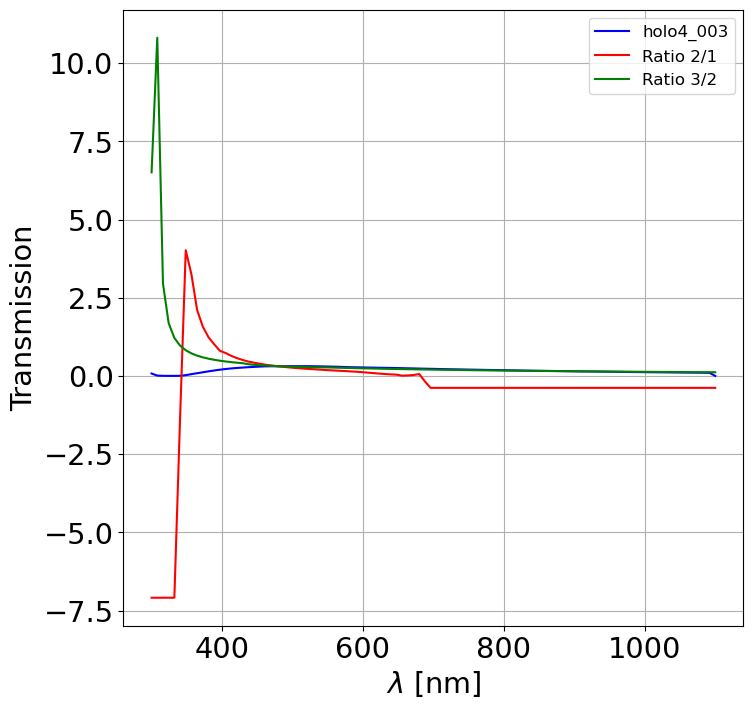

In [23]:
disp.plot_transmission()

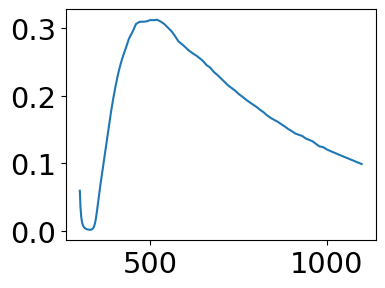

In [24]:
fig = plt.figure(figsize=(4,3))
ax = fig.add_subplot()
ax.plot(tel_lambdas,disp.transmission(tel_lambdas))

## Check the presence of the spectra

### select the date of observation in 2022 and 2023

In [25]:
ALL_DATEOBS = np.array([20230117, 20230118, 20230119, 20230131, 20230201, 20230202,
       20230214, 20230215, 20230216, 20230228, 20230301, 20230302,
       20230314, 20230315, 20230316, 20230509, 20230510, 20230511,
       20230523, 20230524, 20230525, 20230718, 20230720, 20230801,
       20230802, 20230815, 20230817, 20230829, 20230912, 20230913,
       20230914, 20230926, 20230927, 20230928, 20231010, 20231107,
       20231108, 20231113, 20231114, 20231115, 20231116, 20231120,
       20231127, 20231128, 20231129, 20231130, 20231204, 20231205,
       20231206, 20231207, 20231211, 20231212, 20231214, 20231215,
       20231219, 20231220])

file_out_allfittedparams = "out_allfittedparams.csv"

- Split in 4 parts because too many files open

In [26]:

#ALL_DATEOBS = np.array([20220913, 20220914, 20220927, 20220928, 20220929, 20221011,
#       20221012, 20221025, 20221026, 20221027, 20221109, 20221110,
#       20221123, 20221207, 20221208, 20221209, 20221210, 20221212])
#file_out_allfittedparams = "out_allfittedparams_2022_3_3.csv"


#ALL_DATEOBS = np.array([20230117, 20230118, 20230119, 20230131, 20230201, 20230202,
#       20230214, 20230215, 20230216, 20230228, 20230301, 20230302,
#       20230314, 20230315, 20230316]) 
#file_out_allfittedparams = "out_allfittedparams_2023_1_4.csv"
                        
#ALL_DATEOBS = np.array([20230509, 20230510, 20230511,
#       20230523, 20230524, 20230525, 20230718, 20230720, 20230801,
#       20230802, 20230815, 20230817, 20230829]) 
#file_out_allfittedparams = "out_allfittedparams_2023_2_4.csv"                        
                        
#ALL_DATEOBS = np.array([20230912, 20230913,
#       20230914, 20230926, 20230927, 20230928, 20231010, 20231107,
#       20231108, 20231113, 20231114, 20231115, 20231116]) 
#file_out_allfittedparams = "out_allfittedparams_2023_3_4.csv"


#ALL_DATEOBS = np.array([20231120,
#       20231127, 20231128, 20231129, 20231130, 20231204, 20231205,
#       20231206, 20231207, 20231211, 20231212, 20231214, 20231215,
#       20231219, 20231220])
#file_out_allfittedparams = "out_allfittedparams_2023_4_4.csv"

In [27]:
#DATEOBS = 20231207 # studied 2023/12/12
#DATEOBS = 20231206 # studied 2023/12/18
#DATEOBS = 20231205 # studied 2023/12/18
#DATEOBS = 20231204 # studied 2023/12/18
#DATEOBS = 20231130 # studied 2023/12/18
#DATEOBS = 20231129 # studied 2023/12/18
#DATEOBS = 20231128 # studied 2023/12/18
#DATEOBS = 20231127 # studied 2023/12/18

#DATEOBS = 20231120 # studied 2024/01/11 , not too bad
#DATEOBS = 20231116 # studied 2024/01/11 , not too bad
#DATEOBS = 20231115 # studied 2024/01/11 , not too bad, too short
#DATEOBS = 20231114 # studied 2024/01/11 , not too bad, too short
#DATEOBS = 20231113 # studied 2024/01/11 , not too bad, too short

ALL_DATEOBS = np.array([#20230926, 
                        20230927, 20230928, 
                        20231010, 
                        20231107,20231108,
                        20231113,20231114,20231115,20231116,20231120,20231127,20231128,20231129,
                        20231130,20231204,20231205,20231206,20231207]) 

file_out_allfittedparams = "out_allfittedparams_selected_novdec2023.csv"

In [28]:
len(ALL_DATEOBS)

18

## Access to spectra using the butler

In [29]:
all_records = []
count = 0
for DATEOBS in ALL_DATEOBS:
    where = f"instrument='LATISS' and visit.day_obs={DATEOBS}" 
    records = list(butler.registry.queryDimensionRecords('visit', datasets='spectractorSpectrum', where=where,  collections=my_collection))
    all_records.append(records)
    count += len(records)
    print(f">>> {DATEOBS} :  Number of records : ",len(records)," / ", count)
    

>>> 20230927 :  Number of records :  46  /  46
>>> 20230928 :  Number of records :  38  /  84
>>> 20231010 :  Number of records :  60  /  144
>>> 20231107 :  Number of records :  41  /  185
>>> 20231108 :  Number of records :  7  /  192
>>> 20231113 :  Number of records :  10  /  202
>>> 20231114 :  Number of records :  24  /  226
>>> 20231115 :  Number of records :  30  /  256
>>> 20231116 :  Number of records :  36  /  292
>>> 20231120 :  Number of records :  46  /  338
>>> 20231127 :  Number of records :  36  /  374
>>> 20231128 :  Number of records :  33  /  407
>>> 20231129 :  Number of records :  32  /  439
>>> 20231130 :  Number of records :  30  /  469
>>> 20231204 :  Number of records :  41  /  510
>>> 20231205 :  Number of records :  26  /  536
>>> 20231206 :  Number of records :  19  /  555
>>> 20231207 :  Number of records :  20  /  575


In [30]:
len(all_records)

18

## Get params, times, headers and Spectra

In [31]:
all_params_spectrum = []
all_params_spectrogram = []
all_times = []
all_headers = []
all_spectra = []

for idx,DATEOBS in enumerate(ALL_DATEOBS):

    records = all_records[idx]
    print(idx,DATEOBS,len(records))
    params_spectrum = []
    params_spectrogram = []
    times = []
    headers = []
    spectra = []

    for i, r in enumerate(records):
        try:
            times.append(r.day_obs)
            spec =  butler.get('spectractorSpectrum', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
            headers.append(spec.header)
            spectra.append(spec)
            p = butler.get('spectrumLibradtranFitParameters', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
            params_spectrum.append(p)
            p = butler.get('spectrogramLibradtranFitParameters', visit=r.id, collections=my_collection, detector=0, instrument='LATISS')
            params_spectrogram.append(p)
    #except ValueError:
        except Exception as inst:
            except_type = type(inst)
            except_args = inst.args
            print("catch exception ", inst, "type =",except_type, "args = ",except_args) 
            print("\t >>>>> Skip record ", r.id)
            continue

    all_params_spectrum.append(params_spectrum)
    all_params_spectrogram.append(params_spectrogram)
    all_times.append(times)
    all_headers.append(headers)
    all_spectra.append(spectra)

0 20230927 46
************ getObsAtmo imported ************* 
/home/d/dagoret/.local/lib/python3.11/site-packages/getObsAtmo
>>>> _getPackageDir /home/d/dagoret/.local/lib/python3.11/site-packages/getObsAtmo
>>>> getObsSiteDataFrame      altitude   pressure
LSST    2.663  731.50433
CTIO    2.207   774.6052
OHP      0.65  937.22595
PDM    2.8905  710.90637
OMK     4.205  600.17224
OSL       0.0     1013.0
1 20230928 38
2 20231010 60
3 20231107 41


2024-01-17 17:48:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


4 20231108 7


2024-01-17 17:48:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


5 20231113 10


2024-01-17 17:48:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:48:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


6 20231114 24


2024-01-17 17:49:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


7 20231115 30


2024-01-17 17:49:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


8 20231116 36


2024-01-17 17:49:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


9 20231120 46


2024-01-17 17:49:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:34  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:35  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:36  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


10 20231127 36


2024-01-17 17:49:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:49:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


11 20231128 33
12 20231129 32
13 20231130 30
14 20231204 41
15 20231205 26
16 20231206 19
17 20231207 20


## Filtering data

In [32]:
all_filtered_spectra = []

count = 0
for idx,DATEOBS in enumerate(ALL_DATEOBS):
    records = all_records[idx]
    spectra_filtered = filter_data(butler,my_collection,DATEOBS,records)
    count += len(spectra_filtered)
    all_filtered_spectra.append(spectra_filtered)
    print(idx,DATEOBS,len(records),len(spectra_filtered),count)
    

0 20230927 46 19 19
1 20230928 38 15 34
2 20231010 60 25 59


2024-01-17 17:51:37  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:38  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:39  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:40  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:41  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:42  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:43  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:44  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:45  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:46  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:47  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


3 20231107 41 20 79


2024-01-17 17:51:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:48  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


4 20231108 7 1 80


2024-01-17 17:51:49  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:50  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:51  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


5 20231113 10 6 86


2024-01-17 17:51:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:52  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:53  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:54  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:55  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:56  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:57  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


6 20231114 24 10 96


2024-01-17 17:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:58  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:51:59  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:00  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:01  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:02  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:03  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


7 20231115 30 13 109


2024-01-17 17:52:04  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:05  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:06  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:07  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:08  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:09  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:10  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:11  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:12  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


8 20231116 36 13 122


2024-01-17 17:52:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:13  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:14  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:15  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:16  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:17  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:18  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:19  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:20  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:21  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:22  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:23  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


9 20231120 46 20 142


2024-01-17 17:52:24  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:25  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:26  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:27  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:28  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:29  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:30  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:31  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:32  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


2024-01-17 17:52:33  Spectrum   load_spectrum_latest WARNING 
	Failed to set spectrum attribute humidity using header OUTHUM


10 20231127 36 17 159
11 20231128 33 17 176
12 20231129 32 11 187
13 20231130 30 9 196
14 20231204 41 14 210
15 20231205 26 9 219
16 20231206 19 11 230
17 20231207 20 8 238


## Information from atmospheric fits

In [33]:
headers = all_headers[0]

In [34]:
columns_spectrum = ["id"]

for h in headers[0]:
    if "COMMENT" in h or "EXTNAME" in h: continue
    if "LBDAS_T" in h or "PSF_P_T" in h or "AMPLIS_T" in h: continue
    if "UNIT" in h: continue
    if "SIMPLE" in h: continue
    columns_spectrum.append(h)
 
columns_spectrogram_bestfit = []
for key in params_spectrogram[0].labels:
    columns_spectrogram_bestfit.append(key)
    columns_spectrogram_bestfit.append(key+"_err")

columns_spectrum_bestfit = []
for key in params_spectrum[0].labels:
    columns_spectrum_bestfit.append(key)
    columns_spectrum_bestfit.append(key+"_err")

In [35]:
print(columns_spectrum)

['id', 'BITPIX', 'NAXIS', 'NAXIS1', 'NAXIS2', 'EXTEND', 'TARGET', 'REDSHIFT', 'GRATING', 'ROTANGLE', 'D2CCD', 'LSHIFT', 'PARANGLE', 'TARGETX', 'TARGETY', 'LBDA_REF', 'PSF_REG', 'TRACE_R', 'MEANFWHM', 'PIXSHIFT', 'CHI2_FIT', 'A2_FIT', 'AM_FIT', 'VERSION', 'REBIN', 'CONFIG', 'DATE-OBS', 'EXPTIME', 'AIRMASS', 'DEC', 'HA', 'OUTTEMP', 'OUTPRESS', 'OUTHUM', 'FILTER', 'CAM_ROT', 'S_X0', 'S_Y0', 'S_XMIN', 'S_XMAX', 'S_YMIN', 'S_YMAX', 'S_NX', 'S_NY', 'S_DEG', 'S_SAT', 'S_ORDER']


In [36]:
print(columns_spectrogram_bestfit)

['A1', 'A1_err', 'A2', 'A2_err', 'A3', 'A3_err', 'VAOD', 'VAOD_err', 'angstrom_exp', 'angstrom_exp_err', 'ozone [db]', 'ozone [db]_err', 'PWV [mm]', 'PWV [mm]_err', 'D_CCD [mm]', 'D_CCD [mm]_err', 'shift_x [pix]', 'shift_x [pix]_err', 'shift_y [pix]', 'shift_y [pix]_err', 'angle [deg]', 'angle [deg]_err', 'B', 'B_err', 'x_c_0_1', 'x_c_0_1_err', 'x_c_1_1', 'x_c_1_1_err', 'x_c_2_1', 'x_c_2_1_err', 'y_c_0_1', 'y_c_0_1_err', 'y_c_1_1', 'y_c_1_1_err', 'y_c_2_1', 'y_c_2_1_err', 'gamma_0_1', 'gamma_0_1_err', 'gamma_1_1', 'gamma_1_1_err', 'gamma_2_1', 'gamma_2_1_err', 'alpha_0_1', 'alpha_0_1_err', 'alpha_1_1', 'alpha_1_1_err', 'alpha_2_1', 'alpha_2_1_err', 'saturation_0_1', 'saturation_0_1_err', 'x_c_0_2', 'x_c_0_2_err', 'x_c_1_2', 'x_c_1_2_err', 'x_c_2_2', 'x_c_2_2_err', 'y_c_0_2', 'y_c_0_2_err', 'y_c_1_2', 'y_c_1_2_err', 'y_c_2_2', 'y_c_2_2_err', 'gamma_0_2', 'gamma_0_2_err', 'gamma_1_2', 'gamma_1_2_err', 'gamma_2_2', 'gamma_2_2_err', 'alpha_0_2', 'alpha_0_2_err', 'alpha_1_2', 'alpha_1_2_err

In [37]:
print(columns_spectrum_bestfit)

['A1', 'A1_err', 'A2', 'A2_err', 'VAOD', 'VAOD_err', 'angstrom_exp', 'angstrom_exp_err', 'ozone [db]', 'ozone [db]_err', 'PWV [mm]', 'PWV [mm]_err', 'reso [pix]', 'reso [pix]_err', 'D_CCD [mm]', 'D_CCD [mm]_err', 'alpha_pix [pix]', 'alpha_pix [pix]_err', 'B', 'B_err']


## Merge dataframes of general paramters and fitted params

In [38]:
all_df = []

for idx,DATEOBS in enumerate(ALL_DATEOBS):
  
    records = all_records[idx]
    headers = all_headers[idx]
    params_spectrogram = all_params_spectrogram[idx]
    params_spectrum = all_params_spectrum[idx]
   
    min_index = 0
    max_index = np.inf

    # General parameters
    df1 = pd.DataFrame(columns=columns_spectrum)
    for k, header in enumerate(headers):
        # if k > 40: break
        n = records[k].id
        if n < min_index or n > max_index: continue
        row = {"id": n}
        for h in header:
            if h in columns_spectrum:
                row[h] = header[h]
        df1.loc[len(df1)] = row


    # fitted parameters in Spectrogram
    df2 = pd.DataFrame(columns=columns_spectrogram_bestfit)
    for k, p in enumerate(params_spectrogram):
        n = records[k].id
        if n < min_index or n > max_index: continue
        row = {"id": n}
        for i, key in enumerate(p.labels):
            row[key] = p.values[i]
            row[key+"_err"] = p.err[i]
        df2.loc[len(df2)] = row

    # fitted parameters in Spectrum
    df3 = pd.DataFrame(columns=columns_spectrum_bestfit)
    for k, p in enumerate(params_spectrum):
        n = records[k].id
        if n < min_index or n > max_index: continue
        row = {"id": n}
        for i, key in enumerate(p.labels):
            row[key] = p.values[i]
            row[key+"_err"] = p.err[i]
        df3.loc[len(df3)] = row

    df = pd.merge(df1, df2, left_index=True, right_index=True)
    df = pd.merge(df, df3, left_index=True, right_index=True)
    df.set_index('DATE-OBS', inplace=True)
    #df.index = pd.to_datetime(df.index, format="ISO8601") #['DATE-OBS'])
    df.index = pd.to_datetime(df.index) #['DATE-OBS'])
    df.sort_index(inplace=True)

    all_df.append(df)
            

In [39]:
all_df[0].head()

,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,...,PWV [mm]_y,PWV [mm]_err_y,reso [pix],reso [pix]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y
DATE-OBS,,,,,,,,,,,,,,,,,,,,,
2023-09-28 00:17:22.483504618+00:00,2023092700216,-64,2,1067,3,True,HD200654,-0.000149,holo4_003,0.173547,...,2.178739,0.054054,2.604926,0.094678,186.976576,0.013169,1.096243,0.0,0.0,0.0
2023-09-28 00:20:51.389002941+00:00,2023092700222,-64,2,1067,3,True,HD200654,-0.000149,holo4_003,-0.179802,...,9.344527,0.341437,5.128281,0.341254,183.174548,0.052815,-2.000000,0.0,0.0,0.0
2023-09-28 00:21:25.064995394+00:00,2023092700223,-64,2,1066,3,True,HD200654,-0.000149,holo4_003,-0.426635,...,5.924935,0.223724,1.117120,0.070436,185.147533,0.018328,-0.538569,0.0,0.0,0.0
2023-09-28 00:22:32.406005680+00:00,2023092700225,-64,2,1066,3,True,HD200654,-0.000149,holo4_003,0.200093,...,5.000000,0.000000,1.000000,0.000000,188.000000,0.000000,1.692795,0.0,0.0,0.0
2023-09-28 00:24:47.020494847+00:00,2023092700229,-64,2,1067,3,True,HD200654,-0.000149,holo4_003,-0.304797,...,10.000000,0.209858,2.053561,0.217559,186.630435,0.034850,1.352338,0.0,0.0,0.0


In [40]:
all_df[1].head()

,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,...,PWV [mm]_y,PWV [mm]_err_y,reso [pix],reso [pix]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y
DATE-OBS,,,,,,,,,,,,,,,,,,,,,
2023-09-29 01:05:11.429505415+00:00,2023092800160,-64,2,1067,3,True,HD009051,-0.000239,holo4_003,0.161201,...,2.266359,0.038792,4.740279,0.084636,186.825991,0.020009,-1.998000,0.0,0.0,0.0
2023-09-29 01:06:36.947508641+00:00,2023092800161,-64,2,1067,3,True,HD009051,-0.000239,holo4_003,0.149809,...,2.289053,0.027253,1.281853,0.050938,186.836925,0.006944,0.994580,0.0,0.0,0.0
2023-09-29 01:16:31.772005710+00:00,2023092800168,-64,2,1066,3,True,HD205905,-0.000057,holo4_003,0.163604,...,2.354541,0.037335,1.311284,0.045932,186.779233,0.005740,0.988014,0.0,0.0,0.0
2023-09-29 01:17:57.289503108+00:00,2023092800169,-64,2,1067,3,True,HD205905,-0.000057,holo4_003,0.163054,...,2.294448,0.038279,1.359208,0.046150,186.782453,0.005421,1.038145,0.0,0.0,0.0
2023-09-29 01:26:24.209004025+00:00,2023092800176,-64,2,1066,3,True,HD160617,0.000335,holo4_003,0.165961,...,1.979492,0.030959,1.636281,0.046204,186.764416,0.006774,1.019076,0.0,0.0,0.0


In [41]:
df =  pd.concat(all_df)

## Write csv file

In [42]:
# convert pandas to numpy rec array
rec = df.to_records()

In [43]:
filtered = (rec["CHI2_FIT"] < 100) & (rec["PSF_REG"] > 1e-2) & (rec["D2CCD"] > 186)  & (rec["D2CCD"] < 188)  # & (np.abs(rec["PIXSHIFT"]) < 0.5) 
print(np.sum(filtered))
filtered = filtered & (rec["PWV [mm]_err_x"] > 0) & (rec["PWV [mm]_err_x"] < 5) & (rec["A1_err_y"] > 0) & (rec["A1_err_y"] < 5) & (rec["PWV [mm]_err_y"] > 0) & (rec["PWV [mm]_err_y"] < 5)
print(np.sum(filtered))
filtered = filtered & (rec["reso [pix]"] < 3)
print(np.sum(filtered))
filtered = filtered & (rec["ozone [db]_err_y"] > 0) & (rec["ozone [db]_err_y"] < 100)
print(np.sum(filtered))
filtered = filtered & (rec["A1_x"] > 0.1) & (rec["A1_x"] < 1.5)
print(np.sum(filtered))
filtered = filtered & (np.abs(rec["gamma_0_2"]) < 30) & (np.abs(rec["alpha_0_2"]) < 10)
print(np.sum(filtered))

411
403
390
356
355
283


## Save filtering

In [44]:
df["filtered"] =filtered

## Save atmospheric parameters and filters

In [45]:
df.to_csv(file_out_allfittedparams) 

## Plot fitted parameters

In [46]:
stars = np.unique(rec["TARGET"])
stars

array(['HD009051', 'HD14943', 'HD160617', 'HD167060', 'HD185975',
       'HD200654', 'HD205905', 'HD2811', 'HD38666'], dtype=object)

In [47]:
filters = np.unique(rec["FILTER"])
filters

array(['empty'], dtype=object)

In [48]:
ATMMINMAX = {}
ATMMINMAX["A1_y"] = [0.1,1.9]
ATMMINMAX["chi2_y"] = [0.,500.]
ATMMINMAX["ozone [db]_y"] = [0.,600.]
ATMMINMAX["PWV [mm]_y"] = [0.,12.]
ATMMINMAX["VAOD_y"] = [0.,0.5]
ATMMINMAX["A2_y"] = [0.7,1.3]

ATMMINMAX["A1_x"] = [0.1,1.9]
ATMMINMAX["chi2_x"] = [0.,500.]
ATMMINMAX["ozone [db]_x"] = [0.,600.]
ATMMINMAX["PWV [mm]_x"] = [0.,12.]
ATMMINMAX["VAOD_x"] = [0.,0.5]
ATMMINMAX["A2_x"] = [0.7,1.3]

## Plot fitted parameters

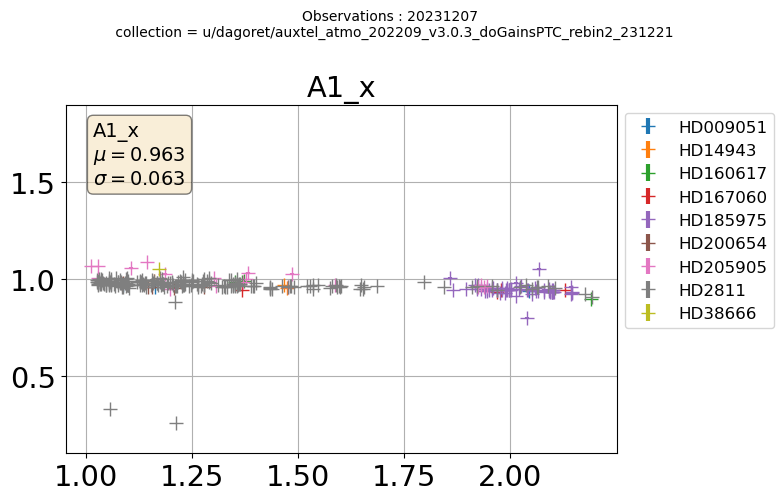

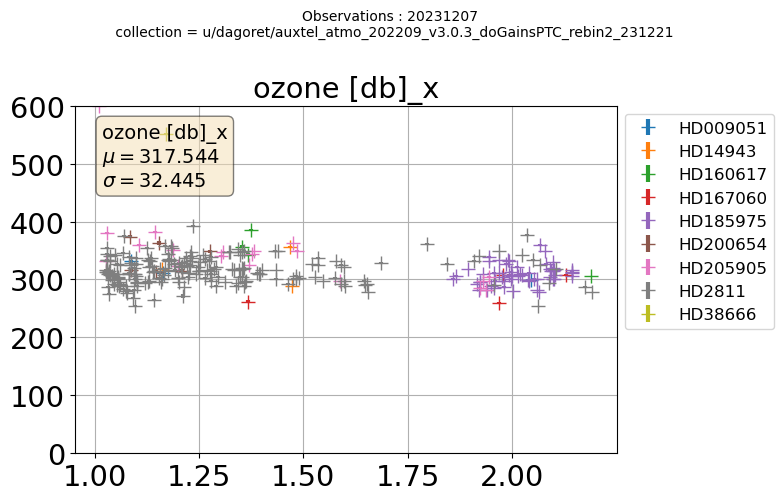

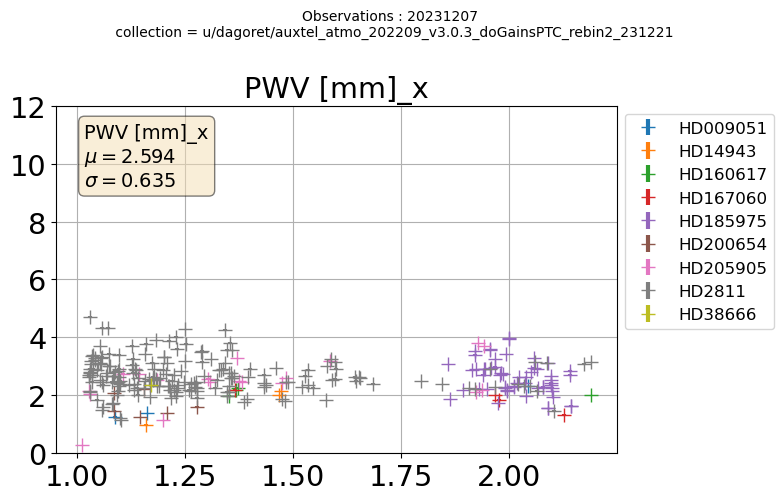

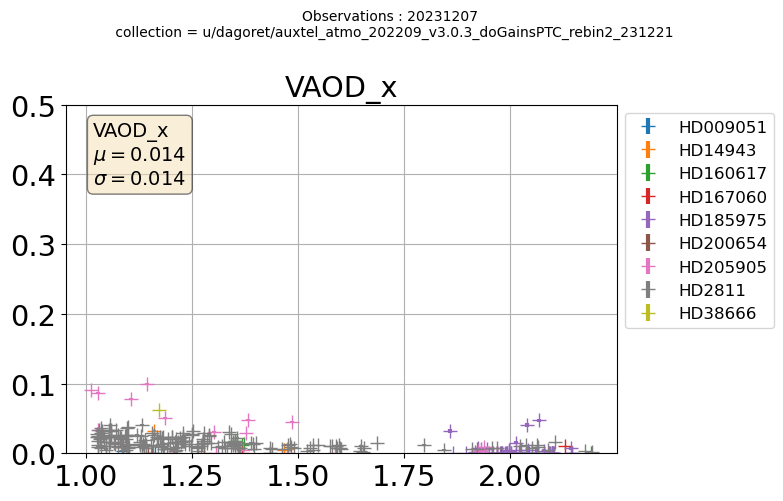

In [49]:
#for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x", "D_CCD [mm]_x", "gamma_0_1", "gamma_0_2", "alpha_0_1", "alpha_0_2", "y_c_0_1", "y_c_0_2" ]:
for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x"]:
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"
    fig = plt.figure(figsize=(8,5))

    index = filtered  & (rec["FILTER"]=="empty")
    all_values = rec[col][index]
    
    mu = all_values.mean()
    sig =all_values.std()
    textstr = '\n'.join((col,
    r'$\mu=%.3f$' % (mu, ),
    r'$\sigma=%.3f$' % (sig, )))



    for star in stars:
        index = filtered & (rec["TARGET"] == star) & (rec["FILTER"]=="empty")
        if col_err in df.columns:
            plt.errorbar(rec["AIRMASS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=10,lw=3 ,label=star)
        else:
            plt.plot(rec["AIRMASS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3 )
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax = plt.gca()
    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=props)
    
    plt.grid()
    plt.title(col)
    plt.legend(bbox_to_anchor=(1,1), loc="upper left")
    #plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.tight_layout()
    plt.show()


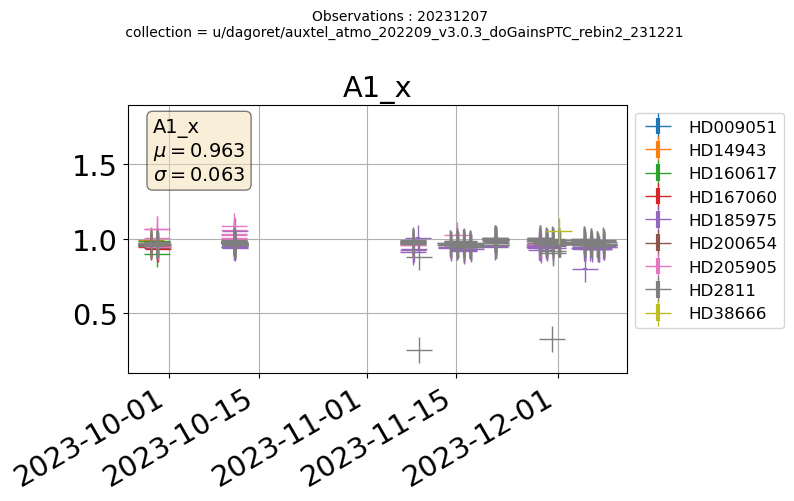

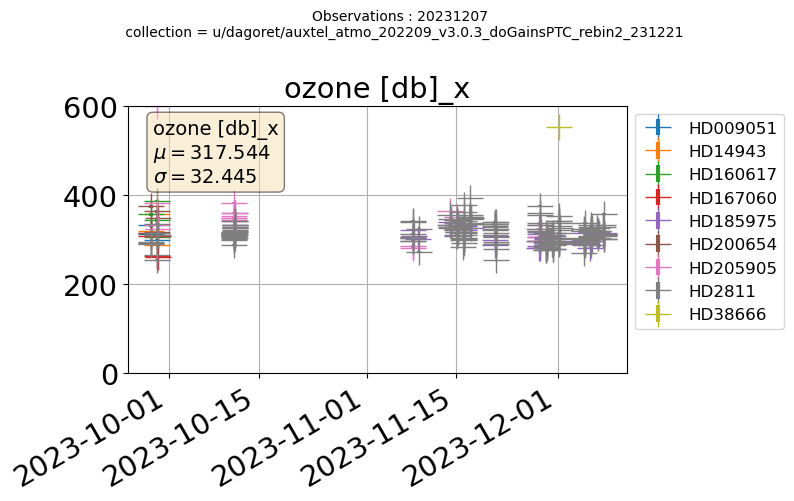

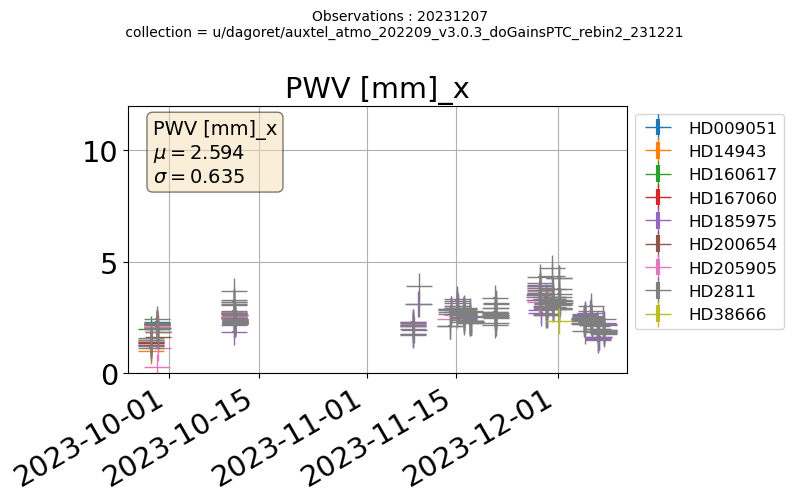

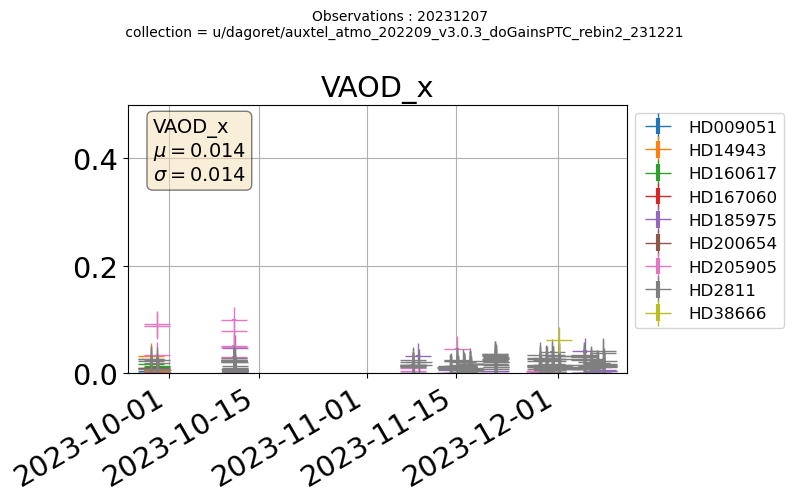

In [50]:
for col in ["A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x"]:
    if len(col.split('_')) > 1:
        col_err = '_'.join(col.split('_')[:-1])+"_err_"+col.split('_')[-1]
    else:
        col_err = col+"_err"

    index = filtered  & (rec["FILTER"]=="empty")
    all_values = rec[col][index]
    mu = all_values.mean()
    sig =all_values.std()
    textstr = '\n'.join((col,
    r'$\mu=%.3f$' % (mu, ),
    r'$\sigma=%.3f$' % (sig, )))

    fig = plt.figure(figsize=(8,5))
    for star in stars:
        index = filtered & (rec["TARGET"] == star)
        if col_err in df.columns:
            plt.errorbar(rec["DATE-OBS"][index], rec[col][index], yerr=rec[col_err][index], linestyle="none", marker="+",ms=19,lw=3 ,label=star)
        else:
            plt.plot(rec["DATE-OBS"][index], rec[col][index], linestyle="none", marker="+",ms=10,lw=3)
    plt.ylim((0.9*np.min(rec[col][filtered]), 1.1*np.max(rec[col][filtered])))
    if col in list(ATMMINMAX.keys()):
        plt.ylim(ATMMINMAX[col][0],ATMMINMAX[col][1])

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax = plt.gca()
    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14, verticalalignment='top', bbox=props)


    plt.grid()
    plt.title(col)
    plt.legend(bbox_to_anchor=(1,1), loc="upper left")
    plt.gcf().autofmt_xdate()
    suptitle = f"Observations : {DATEOBS} \n collection = {my_collection}"
    plt.suptitle(suptitle,fontsize=10,y=1.0)
    plt.tight_layout()
    plt.show()

In [51]:
len(filtered)

575

In [52]:
print(filtered)

[False False False False False False False False False False  True False
 False False False False False  True False False False False  True  True
 False False False  True False  True  True  True False False  True False
 False  True False False False  True False False  True False False  True
  True False  True  True  True False False  True False False  True False
  True  True  True  True  True  True  True  True  True False False  True
 False False  True  True  True False  True  True False False False False
 False False  True  True False  True False  True  True False  True  True
  True False  True  True  True  True  True False  True  True  True  True
  True  True  True  True  True False False  True  True  True  True  True
  True False  True  True  True False False  True  True False False  True
 False False  True False False  True False False False  True  True  True
  True  True  True  True False  True False False  True False  True  True
  True False False False  True  True False False Fa

In [53]:
df.head()

,id,BITPIX,NAXIS,NAXIS1,NAXIS2,EXTEND,TARGET,REDSHIFT,GRATING,ROTANGLE,...,PWV [mm]_err_y,reso [pix],reso [pix]_err,D_CCD [mm]_y,D_CCD [mm]_err_y,alpha_pix [pix],alpha_pix [pix]_err,B_y,B_err_y,filtered
DATE-OBS,,,,,,,,,,,,,,,,,,,,,
2023-09-28 00:17:22.483504618+00:00,2023092700216,-64,2,1067,3,True,HD200654,-0.000149,holo4_003,0.173547,...,0.054054,2.604926,0.094678,186.976576,0.013169,1.096243,0.0,0.0,0.0,False
2023-09-28 00:20:51.389002941+00:00,2023092700222,-64,2,1067,3,True,HD200654,-0.000149,holo4_003,-0.179802,...,0.341437,5.128281,0.341254,183.174548,0.052815,-2.000000,0.0,0.0,0.0,False
2023-09-28 00:21:25.064995394+00:00,2023092700223,-64,2,1066,3,True,HD200654,-0.000149,holo4_003,-0.426635,...,0.223724,1.117120,0.070436,185.147533,0.018328,-0.538569,0.0,0.0,0.0,False
2023-09-28 00:22:32.406005680+00:00,2023092700225,-64,2,1066,3,True,HD200654,-0.000149,holo4_003,0.200093,...,0.000000,1.000000,0.000000,188.000000,0.000000,1.692795,0.0,0.0,0.0,False
2023-09-28 00:24:47.020494847+00:00,2023092700229,-64,2,1067,3,True,HD200654,-0.000149,holo4_003,-0.304797,...,0.209858,2.053561,0.217559,186.630435,0.034850,1.352338,0.0,0.0,0.0,False


0 20230927 19 19
>>> List of targets  ['HD009051' 'HD160617' 'HD167060' 'HD185975' 'HD200654' 'HD2811']
>>> ID.     :  20230927 [2023092700282, 2023092700283, 2023092700290, 2023092700298, 2023092700309, 2023092700350, 2023092700351, 2023092700398, 2023092700407, 2023092700415, 2023092700430, 2023092700431, 2023092700439, 2023092700446, 2023092700447, 2023092700455, 2023092700462, 2023092700463, 2023092700470]
>>> AIRMASS :  20230927 [1.83707260459048, 1.83710176298451, 1.06165209982741, 1.35193009732497, 1.36992910794979, 1.08514093171995, 1.08608779504626, 1.68337977064928, 1.14615471741572, 1.16258780333534, 1.87167339732133, 1.87911565892422, 1.21101689891644, 1.08947155443484, 1.0873479181482, 1.88459168098913, 2.11855855193392, 2.1283254858779, 1.0292164208128]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-09-28 01:09:07.731001435+00:00  2023092700282  HD185975  0.919844   


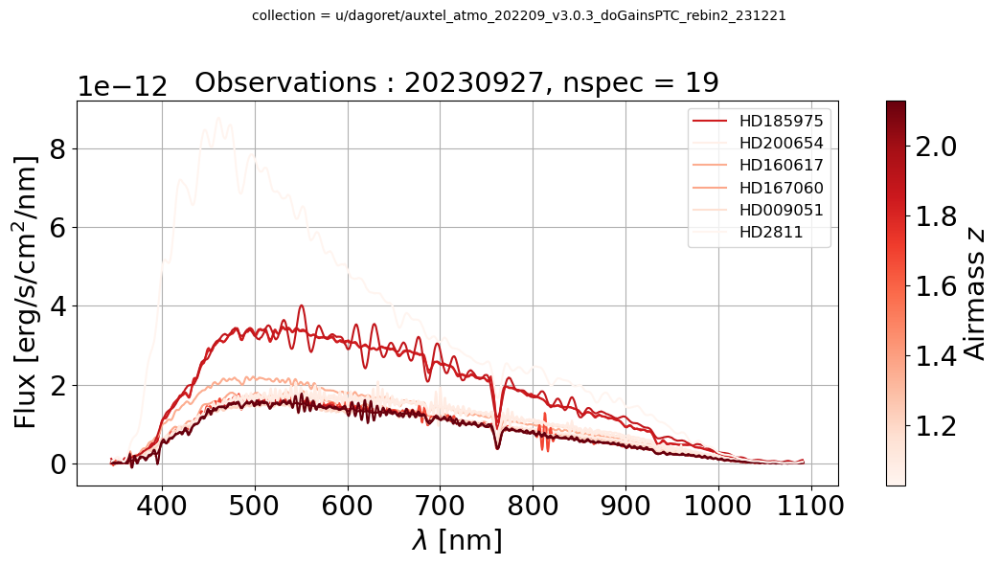

1 20230928 15 34
>>> List of targets  ['HD009051' 'HD160617' 'HD167060' 'HD200654' 'HD2811']
>>> ID.     :  20230928 [2023092800161, 2023092800176, 2023092800177, 2023092800184, 2023092800227, 2023092800259, 2023092800266, 2023092800267, 2023092800274, 2023092800275, 2023092800307, 2023092800332, 2023092800333, 2023092800356, 2023092800357]
>>> AIRMASS :  20230928 [2.04469107631757, 1.36733165045617, 1.37342852379464, 1.36684918200253, 1.0876246409154, 1.09381754237656, 2.18969039769996, 2.20907704503936, 1.15258238325182, 1.15491780189978, 1.977967514831, 1.27319274714756, 1.27727234931251, 1.36079976280231, 1.36561333955159]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-09-29 01:06:36.947508641+00:00  2023092800161  HD009051  0.937635   
2023-09-29 01:26:24.209004025+00:00  2023092800176  HD160617  0.982190   
2023-09-29 01:27:49.985500794+00:00  2023092800177  HD160617  0.98811

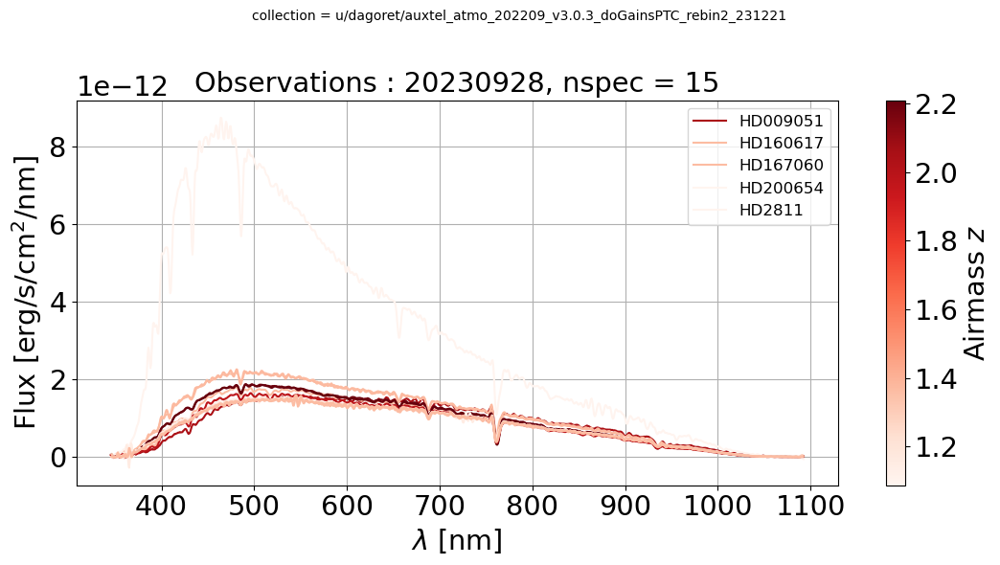

2 20231010 25 59
>>> List of targets  ['HD185975' 'HD205905' 'HD2811']
>>> ID.     :  20231010 [2023101000352, 2023101000358, 2023101000370, 2023101000371, 2023101000384, 2023101000396, 2023101000403, 2023101000443, 2023101000444, 2023101000451, 2023101000507, 2023101000508, 2023101000514, 2023101000521, 2023101000522, 2023101000535, 2023101000536, 2023101000543, 2023101000556, 2023101000571, 2023101000584, 2023101000609, 2023101000610, 2023101000631, 2023101000638]
>>> AIRMASS :  20231010 [1.86476809846317, 1.07437135210369, 1.10355353925367, 1.10593670901751, 1.14428538227033, 1.18655919323918, 1.8944915861701, 1.3764673369979, 1.38239441190885, 1.03586227236182, 1.99031477880307, 1.99111889352817, 1.19033207076426, 1.20978824997625, 1.21294124410385, 1.26062100303697, 1.2642128400857, 2.02030190318836, 1.3519381421359, 1.43435473069881, 1.52112656964602, 2.06658133089254, 2.06730530711587, 1.84454097431272, 1.92083396593776]
                                                id    TARG

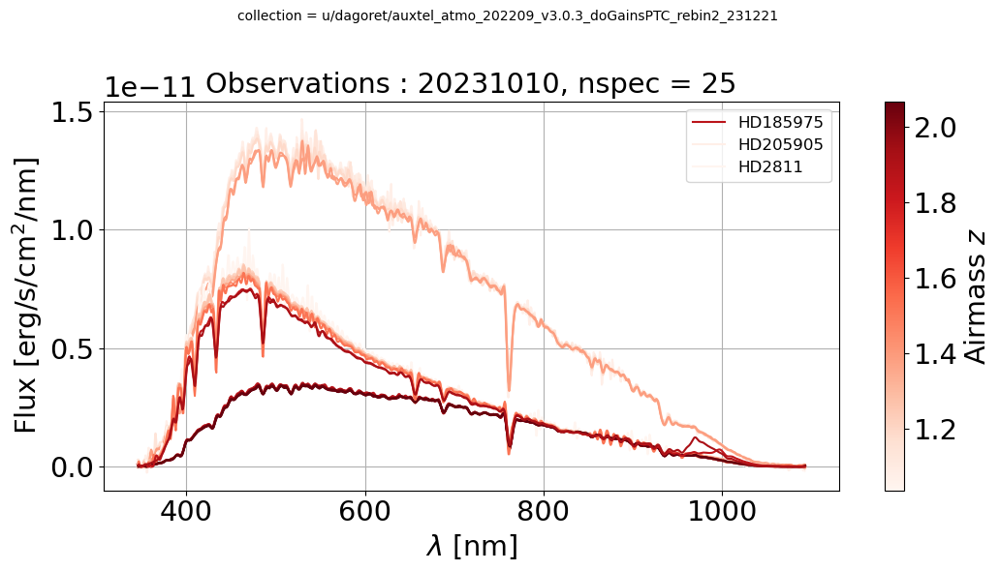

3 20231107 20 79
>>> List of targets  ['HD185975' 'HD2811' 'HD38666']
>>> ID.     :  20231107 [2023110700364, 2023110700384, 2023110700385, 2023110700426, 2023110700427, 2023110700434, 2023110700439, 2023110700440, 2023110700452, 2023110700453, 2023110700486, 2023110700493, 2023110700494, 2023110700500, 2023110700501, 2023110700530, 2023110700550, 2023110700556, 2023110700557, 2023110700571]
>>> AIRMASS :  20231107 [1.08150410157688, 1.97467446800652, 1.9754688916128, 1.22863191366979, 1.23201099929145, 2.01320459088301, 1.27807733606266, 1.28200841680642, 1.34768129940907, 1.35239937382119, 1.54678861313199, 2.06369773141, 2.06443148911837, 1.65605846678763, 1.66442527123212, 1.91953405499685, 2.16652078072684, 2.10331080531695, 2.10388585205142, 1.00759612281391]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-08 03:39:13.397002204+00:00  2023110700364    HD2811  0.993737   
20

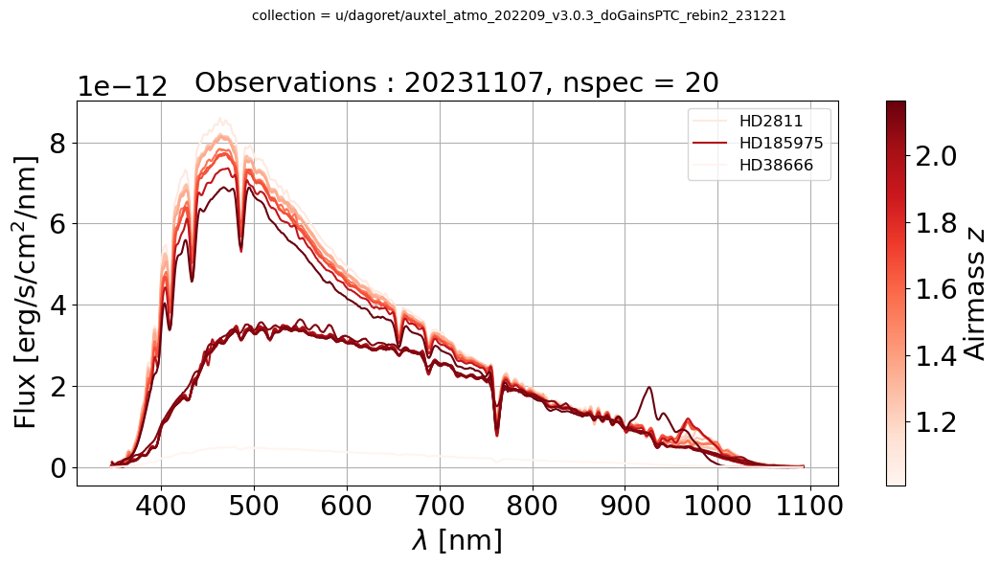

4 20231108 1 80
>>> List of targets  ['HD185975']
>>> ID.     :  20231108 [2023110800278]
>>> AIRMASS :  20231108 [1.85868971794992]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-09 00:23:14.899493940+00:00  2023110800278  HD185975  1.005696   

                                     ozone [db]_x  PWV [mm]_x    VAOD_x  \
DATE-OBS                                                                  
2023-11-09 00:23:14.899493940+00:00    301.294905    3.082407  0.031803   

                                     filtered  
DATE-OBS                                       
2023-11-09 00:23:14.899493940+00:00      True  
 
 /////// SKIPP 2023110800278 

5 20231113 6 86
>>> List of targets  ['HD205905' 'HD2811']
>>> ID.     :  20231113 [2023111300251, 2023111300252, 2023111300260, 2023111300292, 2023111300300, 2023111300301]
>>> AIRMASS :  20231113 [1.02936114100246, 1.02966037157531, 1.4749

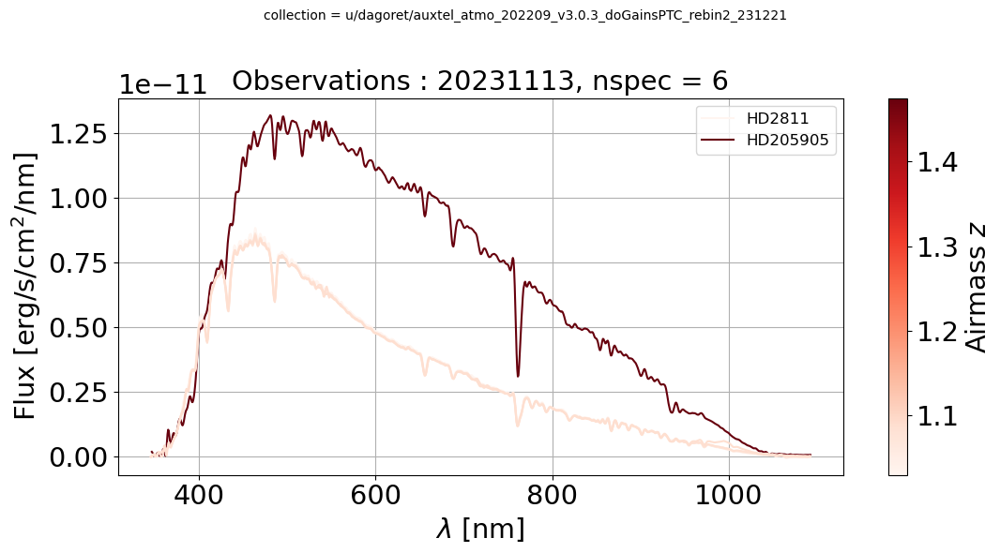

6 20231114 10 96
>>> List of targets  ['HD185975' 'HD205905' 'HD2811']
>>> ID.     :  20231114 [2023111400346, 2023111400353, 2023111400393, 2023111400405, 2023111400406, 2023111400430, 2023111400437, 2023111400445, 2023111400446, 2023111400481]
>>> AIRMASS :  20231114 [1.48536546911215, 1.93397731309342, 1.96885815320162, 1.13480244847674, 1.13705633664655, 1.20577985384641, 1.24202158944147, 1.32825925603229, 1.33275624220698, 1.57867164434887]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-15 02:28:09.797995195+00:00  2023111400346  HD205905  1.028264   
2023-11-15 02:36:51.471991880+00:00  2023111400353  HD185975  0.956088   
2023-11-15 03:31:27.117993175+00:00  2023111400393  HD185975  0.944438   
2023-11-15 03:46:28.775498681+00:00  2023111400405    HD2811  0.972225   
2023-11-15 03:47:41.706999325+00:00  2023111400406    HD2811  0.967425   
2023-11-15 04:19:04.008491142+0

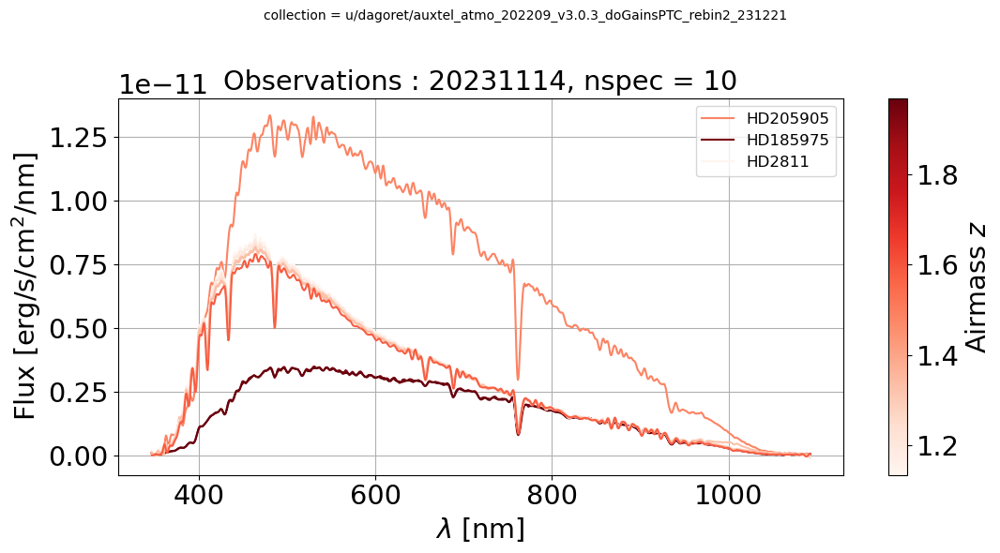

7 20231115 13 109
>>> List of targets  ['HD185975' 'HD2811']
>>> ID.     :  20231115 [2023111500345, 2023111500346, 2023111500352, 2023111500398, 2023111500405, 2023111500413, 2023111500433, 2023111500434, 2023111500448, 2023111500459, 2023111500460, 2023111500466, 2023111500467]
>>> AIRMASS :  20231115 [1.98613788783555, 1.98694117685306, 1.17617582531087, 1.39616648849787, 1.43317905612863, 2.05120301263507, 1.64451061578413, 1.65273779120814, 1.79674680179135, 2.02266366257953, 2.0359608208016, 2.09819897806886, 2.09879626735118]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-16 03:53:51.617495119+00:00  2023111500345  HD185975  0.926591   
2023-11-16 03:55:04.648490696+00:00  2023111500346  HD185975  0.931324   
2023-11-16 04:02:48.568990728+00:00  2023111500352    HD2811  0.966717   
2023-11-16 05:11:59.804999601+00:00  2023111500398    HD2811  0.962322   
2023-11-16 05:20:

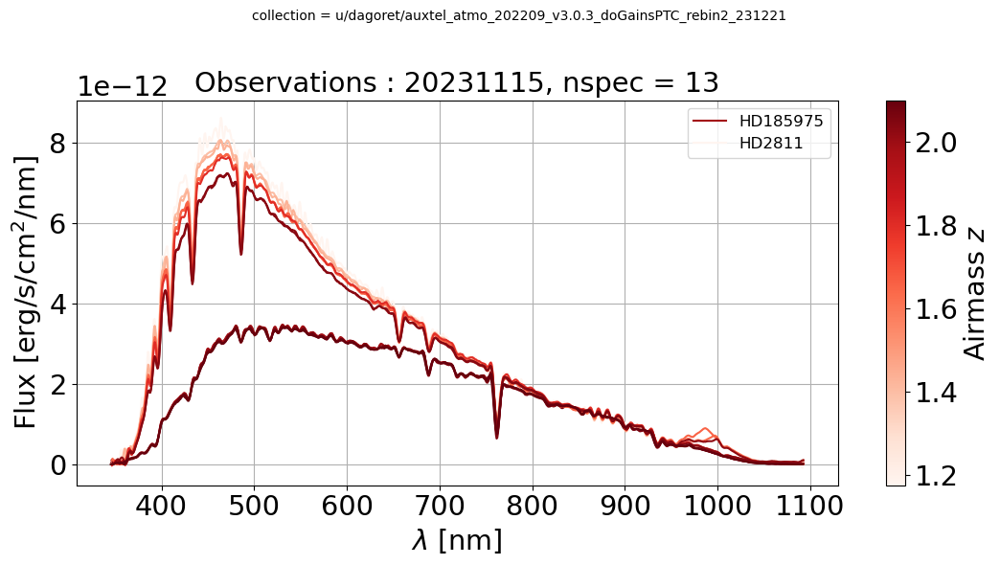

8 20231116 13 122
>>> List of targets  ['HD185975' 'HD205905' 'HD2811']
>>> ID.     :  20231116 [2023111600436, 2023111600437, 2023111600493, 2023111600514, 2023111600527, 2023111600548, 2023111600549, 2023111600562, 2023111600563, 2023111600598, 2023111600599, 2023111600613, 2023111600619]
>>> AIRMASS :  20231116 [1.6056508896384, 1.61472813285907, 1.18503470780996, 2.01465530861709, 1.32087843063553, 1.43272055661941, 1.43839364821339, 1.52912888548746, 1.53594694077535, 2.0789822854761, 2.07966474743723, 1.96938174794147, 2.04996710124899]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-17 02:38:12.794492208+00:00  2023111600436  HD205905  0.938460   
2023-11-17 02:39:25.756007989+00:00  2023111600437  HD205905  0.936724   
2023-11-17 04:02:41.239996422+00:00  2023111600493    HD2811  0.959142   
2023-11-17 04:31:31.960006922+00:00  2023111600514  HD185975  0.928801   
2023-11

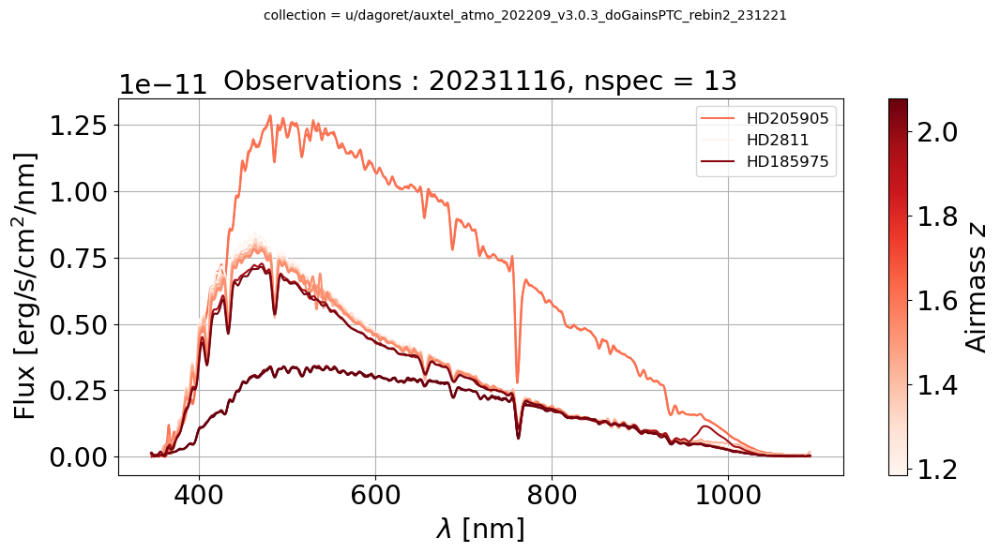

9 20231120 20 142
>>> List of targets  ['HD185975' 'HD2811']
>>> ID.     :  20231120 [2023112000082, 2023112000083, 2023112000113, 2023112000114, 2023112000142, 2023112000163, 2023112000164, 2023112000176, 2023112000177, 2023112000189, 2023112000190, 2023112000202, 2023112000203, 2023112000209, 2023112000210, 2023112000239, 2023112000240, 2023112000266, 2023112000378, 2023112000379]
>>> AIRMASS :  20231120 [1.02965124639104, 1.02996913954069, 1.94400994685639, 1.94476078040974, 1.09460387450384, 1.98023695646798, 1.98103775396734, 1.17552029444915, 1.17826462875008, 1.22132361176201, 1.22460932266256, 1.27507703330845, 1.2789764934228, 2.02377216526679, 2.02457186519696, 1.6470540497264, 1.65533147781872, 1.95600769026649, 2.13996025510354, 2.14015565930435]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-21 01:37:13.904502514+00:00  2023112000082    HD2811  0.984415   
2023-11-2

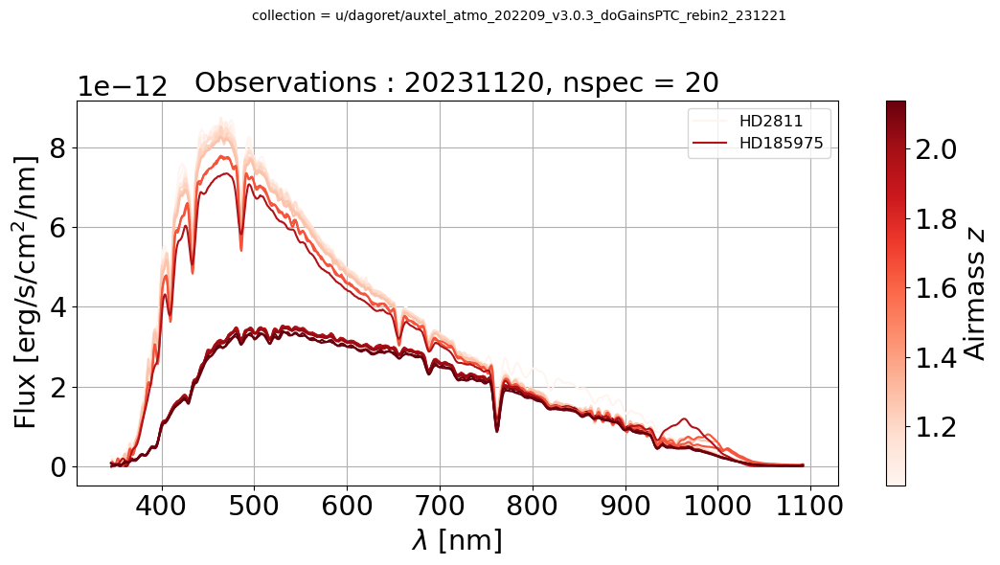

10 20231127 17 159
>>> List of targets  ['HD185975' 'HD205905' 'HD2811']
>>> ID.     :  20231127 [2023112700067, 2023112700073, 2023112700074, 2023112700094, 2023112700115, 2023112700116, 2023112700122, 2023112700123, 2023112700147, 2023112700148, 2023112700168, 2023112700175, 2023112700183, 2023112700196, 2023112700211, 2023112700403, 2023112700404]
>>> AIRMASS :  20231127 [1.37033739370972, 1.92142440284357, 1.92212006775784, 1.58714012183517, 1.95607235587472, 1.95684512476475, 1.92981693377834, 1.94395807802772, 1.12654354434594, 1.12869314872288, 1.18243927172824, 2.00055421259165, 1.23275027501265, 1.28646083308191, 1.35963946813355, 2.14256249399399, 2.14268471157553]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-28 01:15:40.665007708+00:00  2023112700067  HD205905  0.984183   
2023-11-28 01:24:21.031494380+00:00  2023112700073  HD185975  0.948983   
2023-11-28 01:25:34.

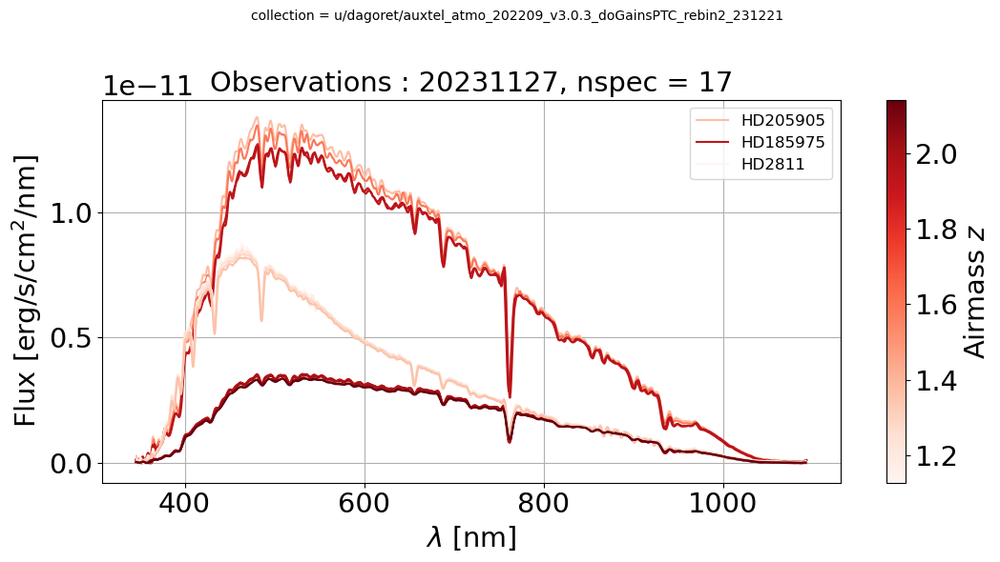

11 20231128 17 176
>>> List of targets  ['HD185975' 'HD2811']
>>> ID.     :  20231128 [2023112800306, 2023112800337, 2023112800344, 2023112800350, 2023112800351, 2023112800387, 2023112800396, 2023112800403, 2023112800409, 2023112800410, 2023112800438, 2023112800439, 2023112800445, 2023112800480, 2023112800481, 2023112800487, 2023112800488]
>>> AIRMASS :  20231128 [1.91654569520835, 1.06719325717717, 1.0764767301782, 1.95825075119908, 1.95902761508848, 1.14227667567622, 1.2948354266279, 2.02758835967186, 1.35861114084195, 1.36345220639526, 2.05845101409023, 2.0591931476228, 1.60018151489937, 2.09086754609941, 2.0915040604888, 2.07450799383192, 2.08855077524966]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-29 01:12:26.106505388+00:00  2023112800306  HD185975  0.957163   
2023-11-29 02:04:09.936497704+00:00  2023112800337    HD2811  0.975161   
2023-11-29 02:12:30.487508933+00:00

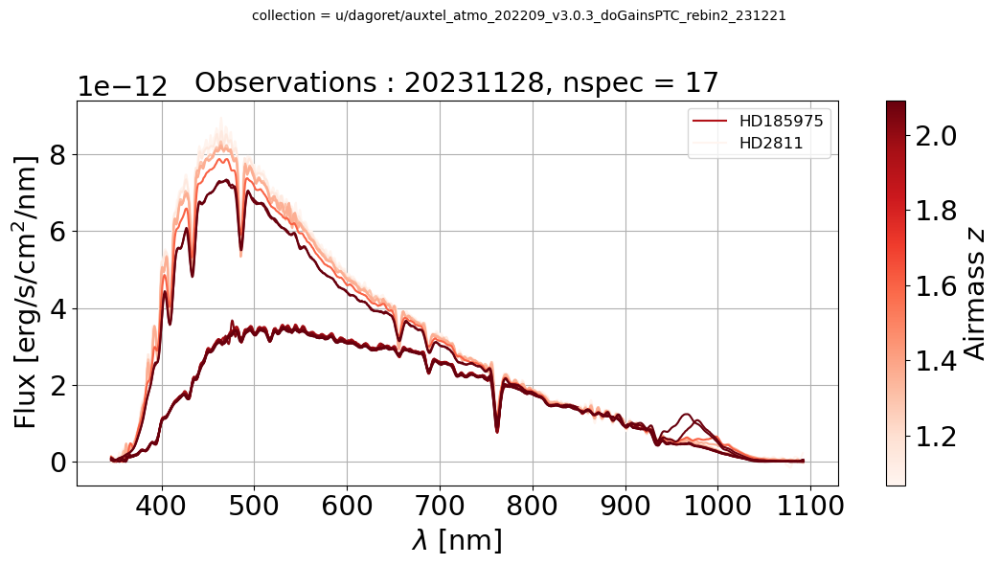

12 20231129 11 187
>>> List of targets  ['HD185975' 'HD2811']
>>> ID.     :  20231129 [2023112900310, 2023112900311, 2023112900317, 2023112900366, 2023112900373, 2023112900380, 2023112900408, 2023112900436, 2023112900465, 2023112900493, 2023112900508]
>>> AIRMASS :  20231129 [1.93641787472087, 1.93715015588567, 1.05692172057992, 1.15809641269543, 1.99264269185798, 1.19899649930844, 1.31102738485376, 1.46201679297201, 2.06506426174543, 1.95630498566047, 2.19082034906294]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-30 01:40:39.339992660+00:00  2023112900310  HD185975  0.918756   
2023-11-30 01:41:52.384997828+00:00  2023112900311  HD185975  0.925081   
2023-11-30 01:49:39.292003446+00:00  2023112900317    HD2811  0.983598   
2023-11-30 02:59:25.426496255+00:00  2023112900366    HD2811  0.977188   
2023-11-30 03:08:26.191008352+00:00  2023112900373  HD185975  0.952746   
2023-11

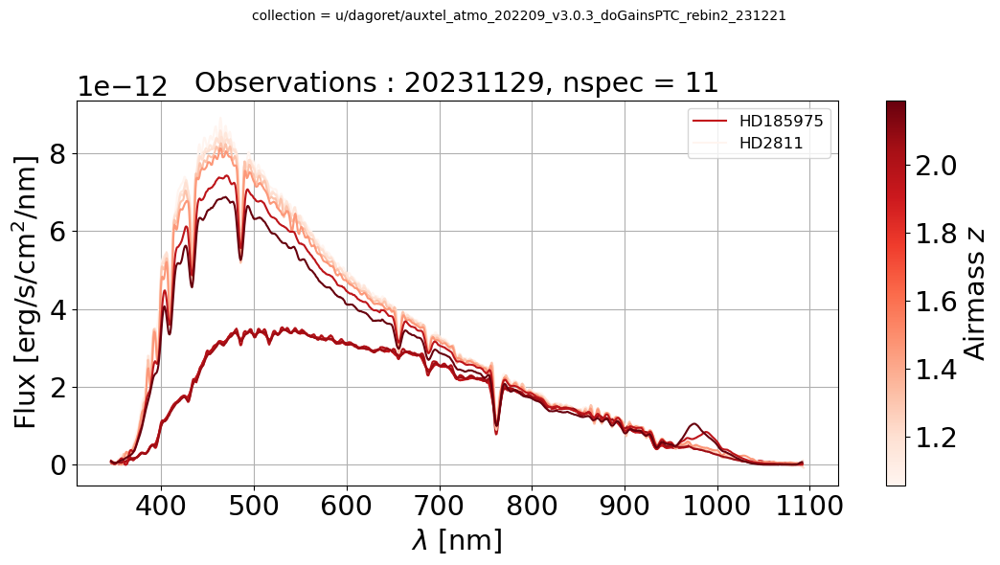

13 20231130 9 196
>>> List of targets  ['HD2811']
>>> ID.     :  20231130 [2023113000311, 2023113000312, 2023113000318, 2023113000332, 2023113000346, 2023113000347, 2023113000360, 2023113000361, 2023113000461]
>>> AIRMASS :  20231130 [1.04752882896602, 1.04842944679405, 1.05412893751206, 1.07259093309158, 1.09680858369916, 1.09855602469585, 1.1271618358835, 1.12931806928214, 1.59680651247345]
                                                id  TARGET      A1_x  \
DATE-OBS                                                               
2023-12-01 01:34:12.078991513+00:00  2023113000311  HD2811  0.966946   
2023-12-01 01:35:25.130508337+00:00  2023113000312  HD2811  0.977364   
2023-12-01 01:42:32.005497692+00:00  2023113000318  HD2811  0.966812   
2023-12-01 02:01:16.112491234+00:00  2023113000332  HD2811  0.971985   
2023-12-01 02:20:17.255503350+00:00  2023113000346  HD2811  0.969561   
2023-12-01 02:21:30.292502124+00:00  2023113000347  HD2811  0.967816   
2023-12-01 02:39:21.41249652

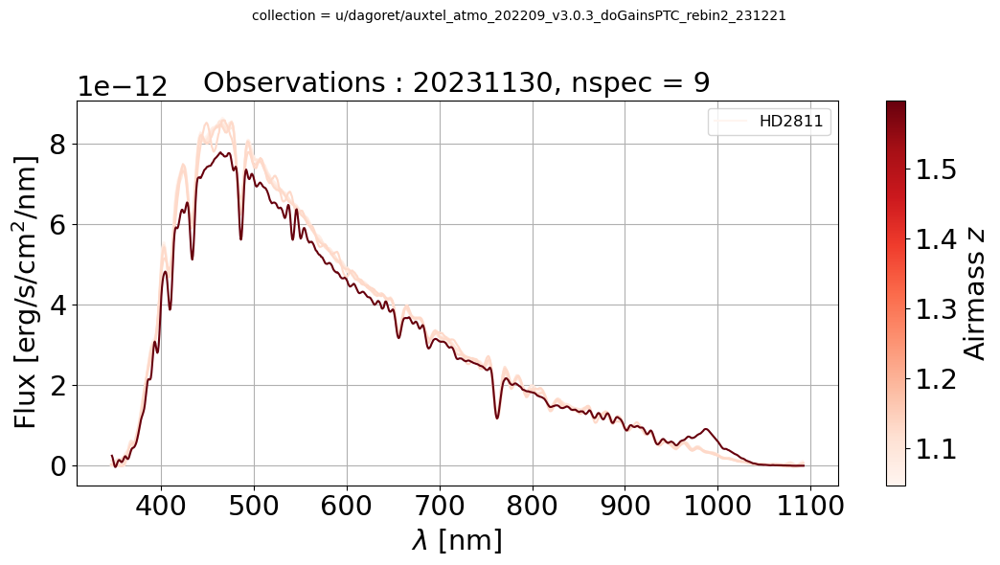

14 20231204 14 210
>>> List of targets  ['HD185975' 'HD2811']
>>> ID.     :  20231204 [2023120400308, 2023120400309, 2023120400378, 2023120400379, 2023120400421, 2023120400434, 2023120400435, 2023120400448, 2023120400449, 2023120400474, 2023120400488, 2023120400489, 2023120400623, 2023120400624]
>>> AIRMASS :  20231204 [1.9480614657494, 1.94882146116799, 1.21439958843962, 1.21760528312472, 2.03951778255777, 1.48317646701871, 1.48945269705585, 1.59070679998468, 1.59829321311402, 1.91384773020259, 2.09776963945996, 2.09836942090847, 2.14227162009967, 2.14238568684147]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-05 01:41:01.864008724+00:00  2023120400308  HD185975  0.941800   
2023-12-05 01:42:14.882495559+00:00  2023120400309  HD185975  0.941085   
2023-12-05 03:03:47.334991940+00:00  2023120400378    HD2811  0.965931   
2023-12-05 03:05:00.343489866+00:00  2023120400379    HD2

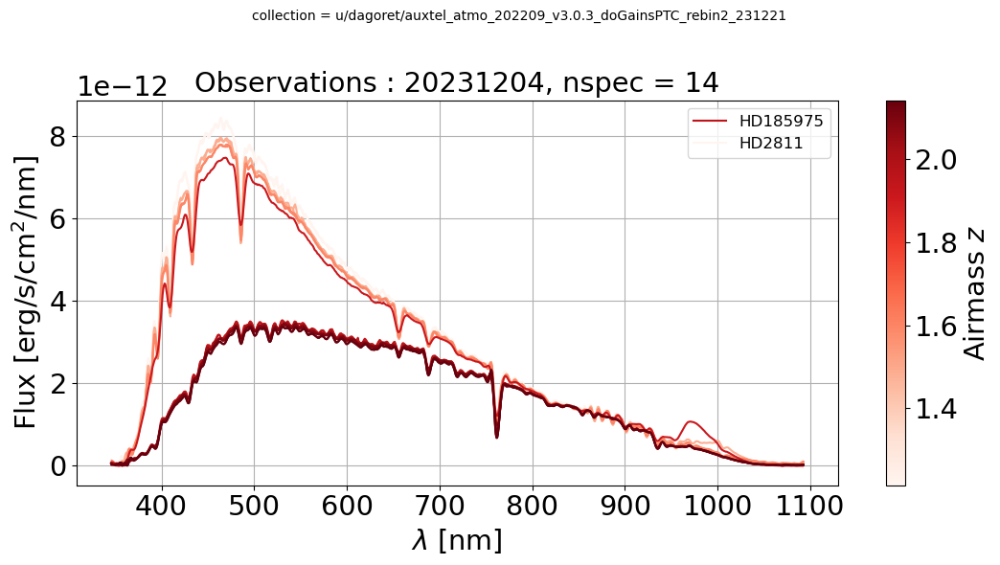

15 20231205 9 219
>>> List of targets  ['HD185975' 'HD2811']
>>> ID.     :  20231205 [2023120500293, 2023120500321, 2023120500322, 2023120500336, 2023120500350, 2023120500383, 2023120500389, 2023120500390, 2023120500442]
>>> AIRMASS :  20231205 [1.93998110374528, 1.09853343878459, 1.10030059270646, 1.13118642329847, 1.16920371425652, 1.24847138976972, 1.27010928086886, 1.27395029809539, 2.10003292480613]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-06 01:24:18.064498385+00:00  2023120500293  HD185975  0.938890   
2023-12-06 02:01:49.710506239+00:00  2023120500321    HD2811  0.974307   
2023-12-06 02:03:02.624003120+00:00  2023120500322    HD2811  0.968731   
2023-12-06 02:21:57.299001189+00:00  2023120500336    HD2811  0.966838   
2023-12-06 02:41:02.213507697+00:00  2023120500350    HD2811  0.970415   
2023-12-06 03:12:08.042500930+00:00  2023120500383    HD2811  0.966495   


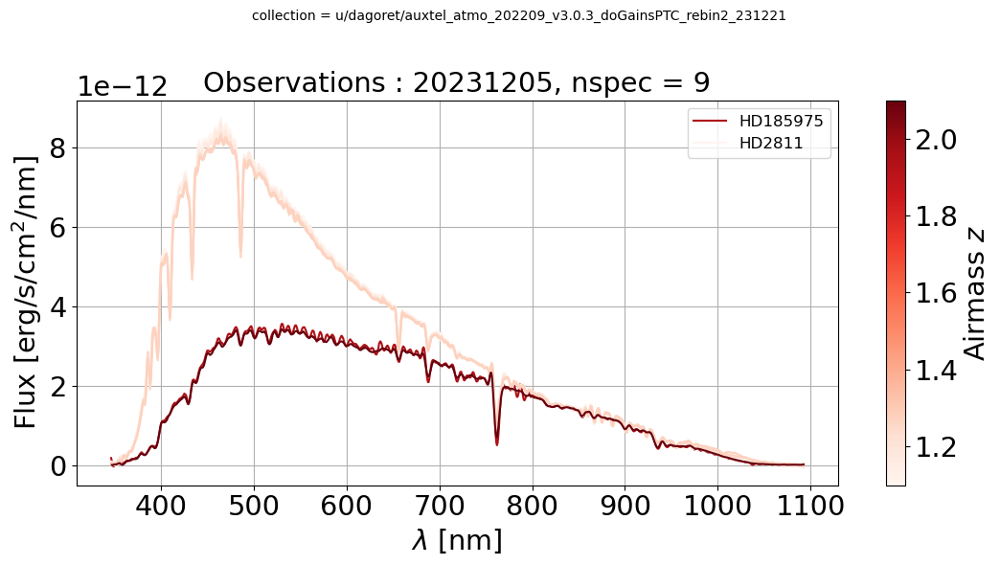

16 20231206 11 230
>>> List of targets  ['HD185975' 'HD2811']
>>> ID.     :  20231206 [2023120600077, 2023120600078, 2023120600106, 2023120600113, 2023120600134, 2023120600182, 2023120600183, 2023120600189, 2023120600190, 2023120600357, 2023120600358]
>>> AIRMASS :  20231206 [1.22576037871197, 1.22909623847932, 1.34670045037051, 2.04080550408909, 1.57580300610864, 2.09138533508202, 2.09201874648357, 2.09154421486717, 2.10580792040668, 2.14424818945613, 2.14422439745313]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-07 03:00:10.879496091+00:00  2023120600077    HD2811  0.963789   
2023-12-07 03:01:23.800490341+00:00  2023120600078    HD2811  0.968235   
2023-12-07 03:37:19.026997552+00:00  2023120600106    HD2811  0.965942   
2023-12-07 03:52:50.598998771+00:00  2023120600113  HD185975  0.944279   
2023-12-07 04:24:35.238496669+00:00  2023120600134    HD2811  0.955324   
2023-12

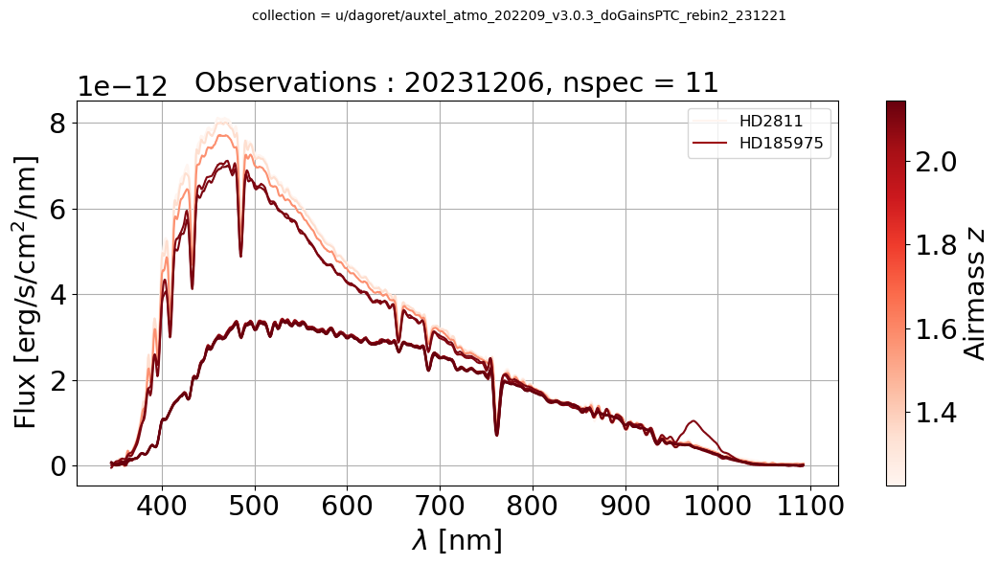

17 20231207 8 238
>>> List of targets  ['HD185975' 'HD2811']
>>> ID.     :  20231207 [2023120700289, 2023120700358, 2023120700366, 2023120700399, 2023120700420, 2023120700421, 2023120700434, 2023120700435]
>>> AIRMASS :  20231207 [1.93094174377831, 1.16839388596346, 1.99681450280567, 1.27878344368903, 1.38806268962779, 1.39323843263595, 1.47569331882934, 1.48188142264463]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-08 01:01:44.209006145+00:00  2023120700289  HD185975  0.949514   
2023-12-08 02:32:48.268490226+00:00  2023120700358    HD2811  0.976643   
2023-12-08 02:43:11.485505028+00:00  2023120700366  HD185975  0.943156   
2023-12-08 03:14:06.988503349+00:00  2023120700399    HD2811  0.968286   
2023-12-08 03:43:37.521992488+00:00  2023120700420    HD2811  0.965867   
2023-12-08 03:44:50.441503941+00:00  2023120700421    HD2811  0.964335   
2023-12-08 04:02:32.741498325+00:

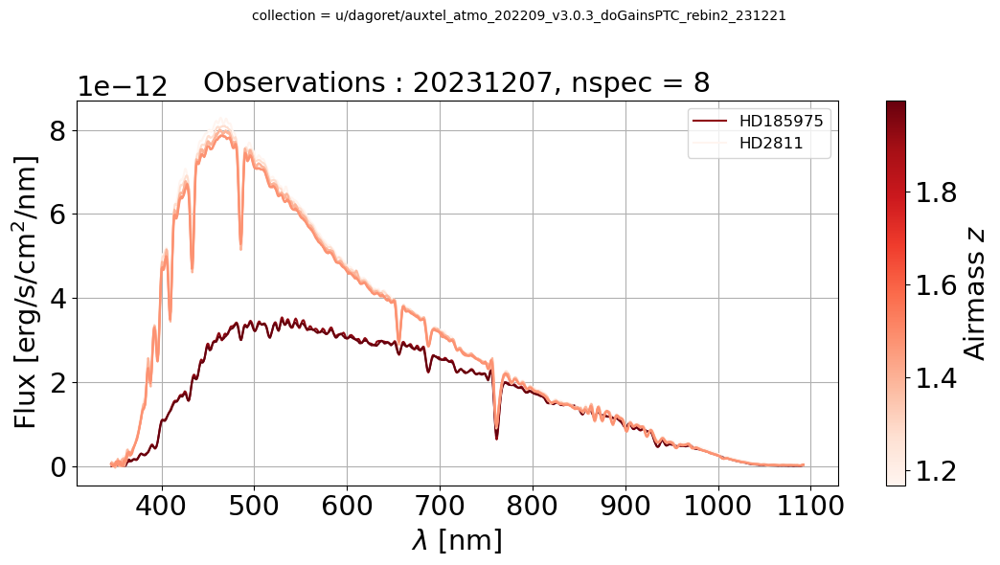

In [55]:
count = 0
all_lists_of_targets = []
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]
    N = len(filtered_spectra)
    count += N
    print(idx,DATEOBS,len(filtered_spectra),count) 
    list_of_targets = np.unique([spec.target.label for spec in filtered_spectra])
    print(">>> List of targets ",list_of_targets)
    all_lists_of_targets.append(list_of_targets)
   
    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    print(df_sel)
    
    if N>1:
        fig = plot_spectra(filtered_spectra, [spec.airmass for spec in filtered_spectra],collection=my_collection,dateobs=DATEOBS)
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")

## Make SED dictionnary

In [57]:
list_of_all_targets = np.unique(np.concatenate(all_lists_of_targets))

In [58]:
import getCalspec.getCalspec as gcal
all_calspecs = {}
for target_name in list_of_all_targets:
    c =  gcal.Calspec(target_name) 
    all_calspecs[target_name] = c.get_spectrum_numpy() 

(0.0, 5e-11)

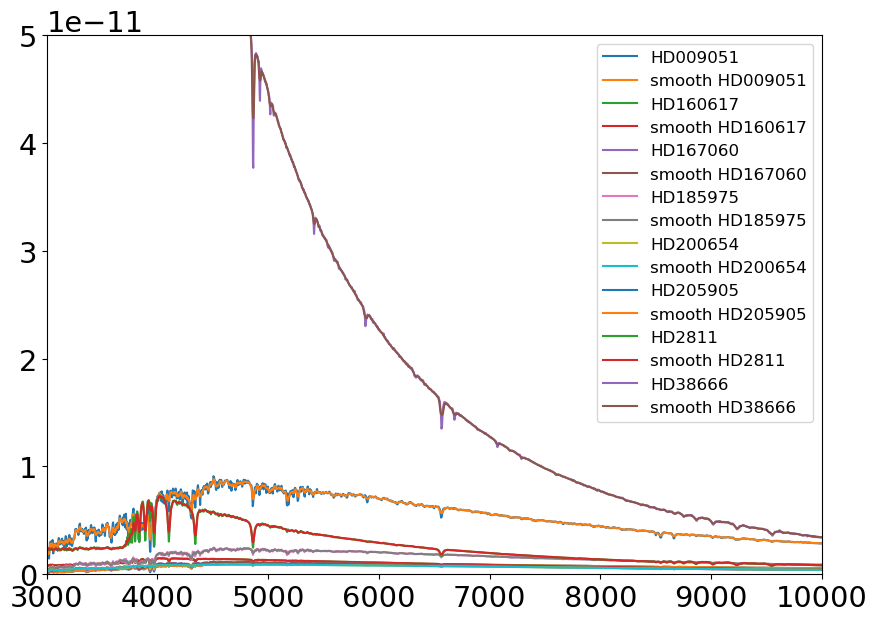

In [59]:
all_calspecs_sm = {}
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot()
span = 3
for target_name in list_of_all_targets:
    c_dict = all_calspecs[target_name]
    wls = c_dict["WAVELENGTH"].value
    sed = c_dict["FLUX"].value
    ax.plot(wls,sed,label=target_name)
    
    sedm = smooth_data_np_convolve(sed,span)
    c_dict_sm = {"WAVELENGTH":wls,"FLUX":sedm}
    all_calspecs_sm[target_name] = c_dict_sm
    ax.plot(wls,sedm,label="smooth " +target_name)
ax.legend()
ax.set_xlim(3000.,10000.)   
ax.set_ylim(0.,0.5e-10)

In [60]:
all_calspecs_sm

{'HD009051': {'WAVELENGTH': array([  1710.263306,   1711.634155,   1713.005005, ..., 318273.59375 ,
         318548.53125 , 318822.46875 ]),
  'FLUX': array([1.95106566e-15, 2.95379422e-15, 3.95090852e-15, ...,
         2.25098137e-18, 1.87257694e-18, 1.49546937e-18])},
 'HD160617': {'WAVELENGTH': array([  1710.760986,   1712.131836,   1713.502563, ..., 318405.53125 ,
         318724.0625  , 319042.96875 ]),
  'FLUX': array([1.88004287e-14, 2.24287144e-14, 2.58695716e-14, ...,
         1.30608448e-18, 1.08623182e-18, 8.67252535e-19])},
 'HD167060': {'WAVELENGTH': array([  1711.033203,   1712.404175,   1713.775269, ..., 318366.125   ,
         318641.15625 , 318915.15625 ]),
  'FLUX': array([-1.78073284e-15, -3.37944715e-15, -4.00438999e-15, ...,
          1.15112402e-18,  9.57610481e-19,  7.64761992e-19])},
 'HD185975': {'WAVELENGTH': array([  1710.563477,   1711.934326,   1713.305298, ..., 318329.84375 ,
         318604.8125  , 318878.78125 ]),
  'FLUX': array([-6.52666268e-16, -1.593

## Plot atmospheric transmissions

>>> ID.     :  20230927 [2023092700282, 2023092700283, 2023092700290, 2023092700298, 2023092700309, 2023092700350, 2023092700351, 2023092700398, 2023092700407, 2023092700415, 2023092700430, 2023092700431, 2023092700439, 2023092700446, 2023092700447, 2023092700455, 2023092700462, 2023092700463, 2023092700470]
>>> AIRMASS :  20230927 [1.83707260459048, 1.83710176298451, 1.06165209982741, 1.35193009732497, 1.36992910794979, 1.08514093171995, 1.08608779504626, 1.68337977064928, 1.14615471741572, 1.16258780333534, 1.87167339732133, 1.87911565892422, 1.21101689891644, 1.08947155443484, 1.0873479181482, 1.88459168098913, 2.11855855193392, 2.1283254858779, 1.0292164208128]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-09-28 01:09:07.731001435+00:00  2023092700282  HD185975  0.919844   
2023-09-28 01:10:20.660995968+00:00  2023092700283  HD185975  0.922407   
2023-09-28 01:17:58.019506853+

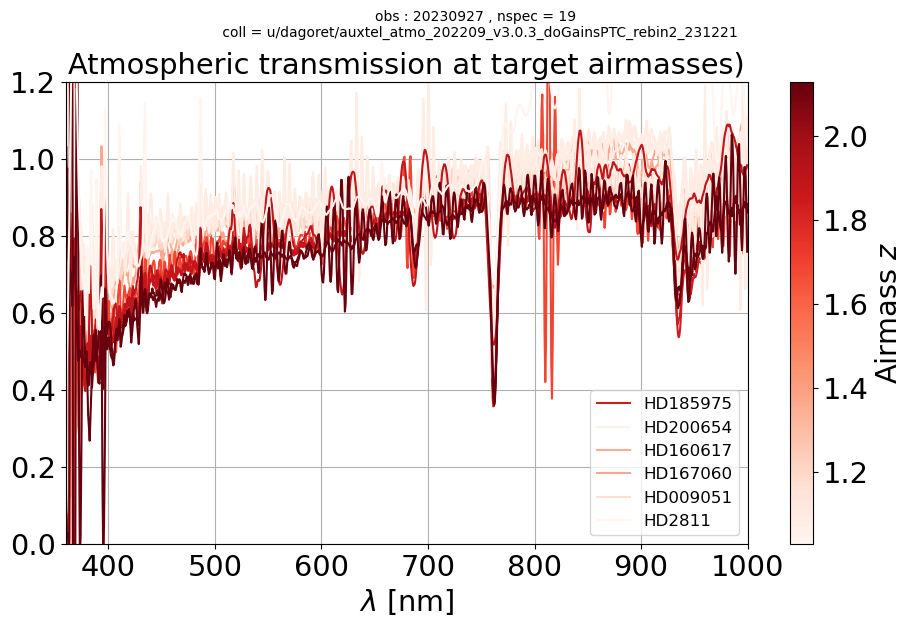

>>> ID.     :  20230928 [2023092800161, 2023092800176, 2023092800177, 2023092800184, 2023092800227, 2023092800259, 2023092800266, 2023092800267, 2023092800274, 2023092800275, 2023092800307, 2023092800332, 2023092800333, 2023092800356, 2023092800357]
>>> AIRMASS :  20230928 [2.04469107631757, 1.36733165045617, 1.37342852379464, 1.36684918200253, 1.0876246409154, 1.09381754237656, 2.18969039769996, 2.20907704503936, 1.15258238325182, 1.15491780189978, 1.977967514831, 1.27319274714756, 1.27727234931251, 1.36079976280231, 1.36561333955159]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-09-29 01:06:36.947508641+00:00  2023092800161  HD009051  0.937635   
2023-09-29 01:26:24.209004025+00:00  2023092800176  HD160617  0.982190   
2023-09-29 01:27:49.985500794+00:00  2023092800177  HD160617  0.988114   
2023-09-29 01:35:18.622498139+00:00  2023092800184  HD167060  0.943157   
2023-09-29 02:

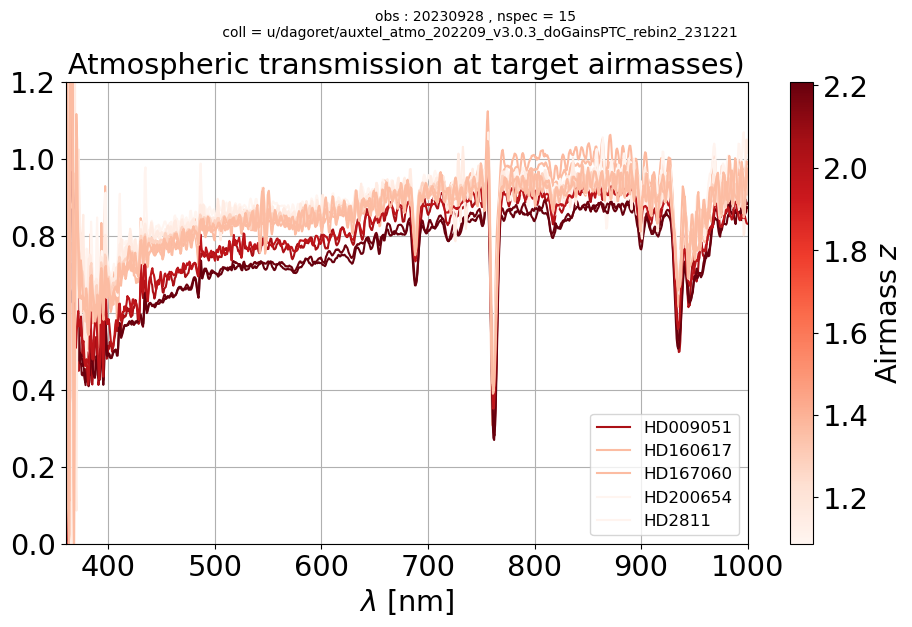

>>> ID.     :  20231010 [2023101000352, 2023101000358, 2023101000370, 2023101000371, 2023101000384, 2023101000396, 2023101000403, 2023101000443, 2023101000444, 2023101000451, 2023101000507, 2023101000508, 2023101000514, 2023101000521, 2023101000522, 2023101000535, 2023101000536, 2023101000543, 2023101000556, 2023101000571, 2023101000584, 2023101000609, 2023101000610, 2023101000631, 2023101000638]
>>> AIRMASS :  20231010 [1.86476809846317, 1.07437135210369, 1.10355353925367, 1.10593670901751, 1.14428538227033, 1.18655919323918, 1.8944915861701, 1.3764673369979, 1.38239441190885, 1.03586227236182, 1.99031477880307, 1.99111889352817, 1.19033207076426, 1.20978824997625, 1.21294124410385, 1.26062100303697, 1.2642128400857, 2.02030190318836, 1.3519381421359, 1.43435473069881, 1.52112656964602, 2.06658133089254, 2.06730530711587, 1.84454097431272, 1.92083396593776]
                                                id    TARGET      A1_x  \
DATE-OBS                                               

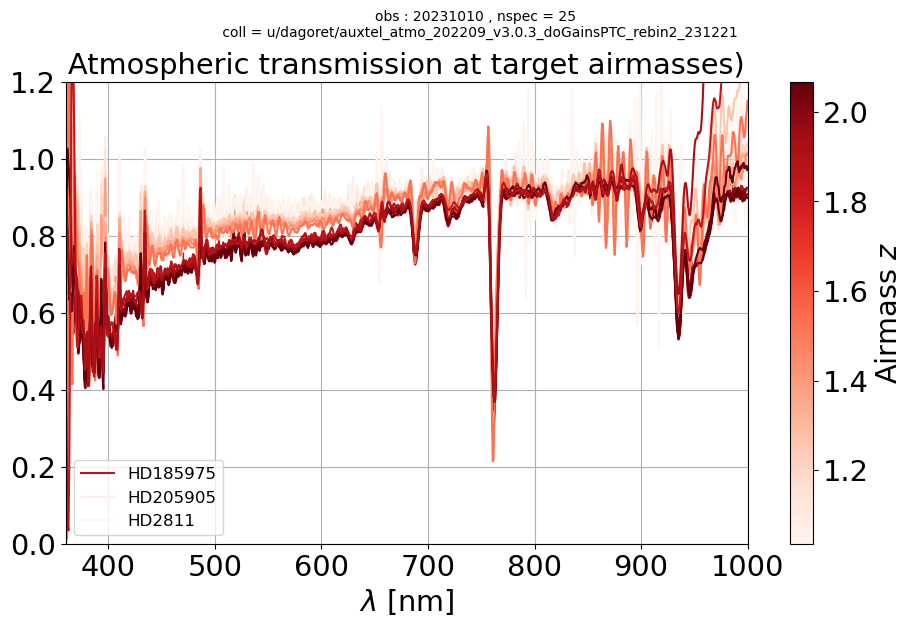

>>> ID.     :  20231107 [2023110700364, 2023110700384, 2023110700385, 2023110700426, 2023110700427, 2023110700434, 2023110700439, 2023110700440, 2023110700452, 2023110700453, 2023110700486, 2023110700493, 2023110700494, 2023110700500, 2023110700501, 2023110700530, 2023110700550, 2023110700556, 2023110700557, 2023110700571]
>>> AIRMASS :  20231107 [1.08150410157688, 1.97467446800652, 1.9754688916128, 1.22863191366979, 1.23201099929145, 2.01320459088301, 1.27807733606266, 1.28200841680642, 1.34768129940907, 1.35239937382119, 1.54678861313199, 2.06369773141, 2.06443148911837, 1.65605846678763, 1.66442527123212, 1.91953405499685, 2.16652078072684, 2.10331080531695, 2.10388585205142, 1.00759612281391]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-08 03:39:13.397002204+00:00  2023110700364    HD2811  0.993737   
2023-11-08 04:07:54.241501484+00:00  2023110700384  HD185975  0.944763  

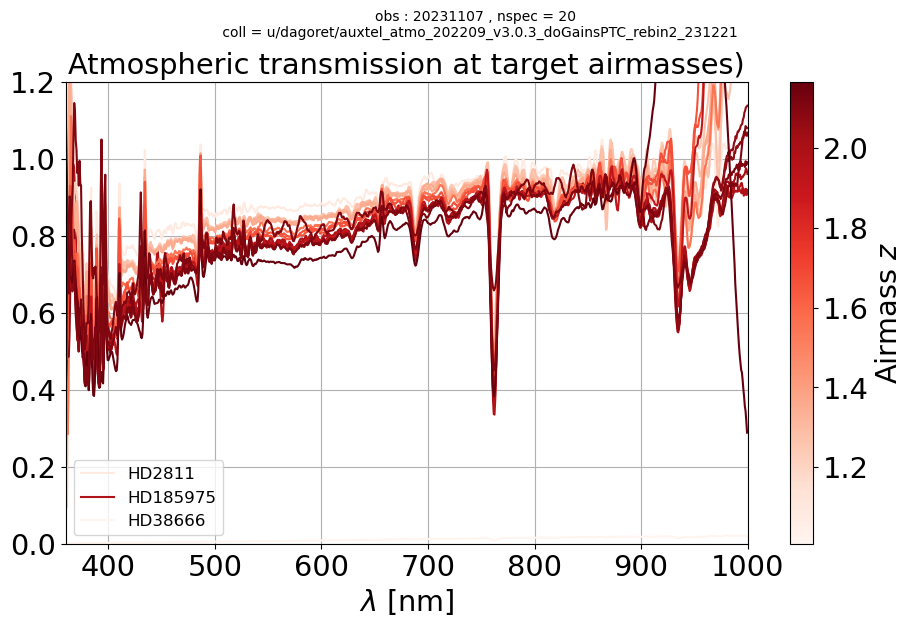

>>> ID.     :  20231108 [2023110800278]
>>> AIRMASS :  20231108 [1.85868971794992]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-09 00:23:14.899493940+00:00  2023110800278  HD185975  1.005696   

                                     ozone [db]_x  PWV [mm]_x    VAOD_x  \
DATE-OBS                                                                  
2023-11-09 00:23:14.899493940+00:00    301.294905    3.082407  0.031803   

                                     filtered  
DATE-OBS                                       
2023-11-09 00:23:14.899493940+00:00      True  
 
 /////// SKIPP 2023110800278 

>>> ID.     :  20231113 [2023111300251, 2023111300252, 2023111300260, 2023111300292, 2023111300300, 2023111300301]
>>> AIRMASS :  20231113 [1.02936114100246, 1.02966037157531, 1.47496993155041, 1.06896415431243, 1.08604637715068, 1.08763496545079]
                                           

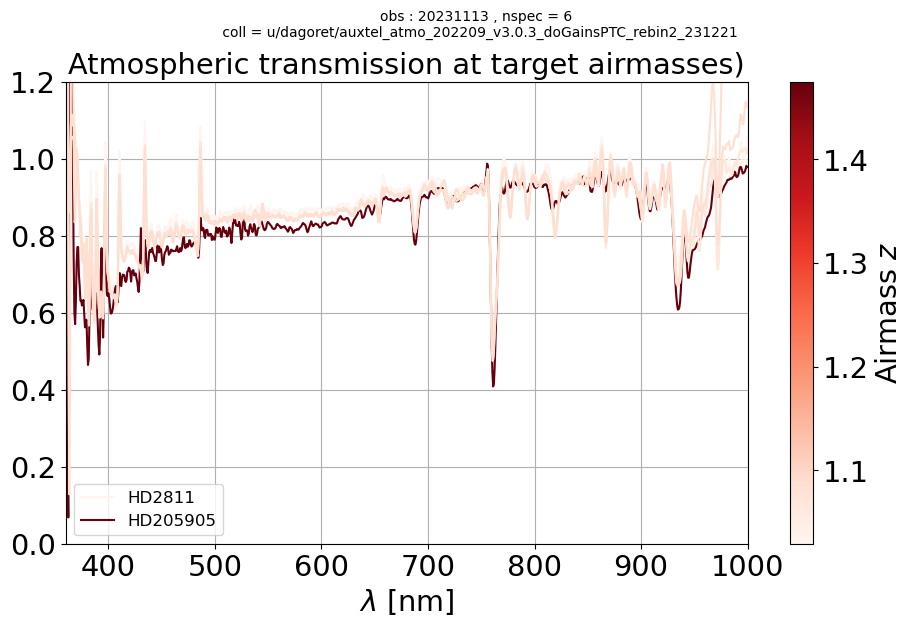

>>> ID.     :  20231114 [2023111400346, 2023111400353, 2023111400393, 2023111400405, 2023111400406, 2023111400430, 2023111400437, 2023111400445, 2023111400446, 2023111400481]
>>> AIRMASS :  20231114 [1.48536546911215, 1.93397731309342, 1.96885815320162, 1.13480244847674, 1.13705633664655, 1.20577985384641, 1.24202158944147, 1.32825925603229, 1.33275624220698, 1.57867164434887]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-15 02:28:09.797995195+00:00  2023111400346  HD205905  1.028264   
2023-11-15 02:36:51.471991880+00:00  2023111400353  HD185975  0.956088   
2023-11-15 03:31:27.117993175+00:00  2023111400393  HD185975  0.944438   
2023-11-15 03:46:28.775498681+00:00  2023111400405    HD2811  0.972225   
2023-11-15 03:47:41.706999325+00:00  2023111400406    HD2811  0.967425   
2023-11-15 04:19:04.008491142+00:00  2023111400430    HD2811  0.966545   
2023-11-15 04:32:27.27649964

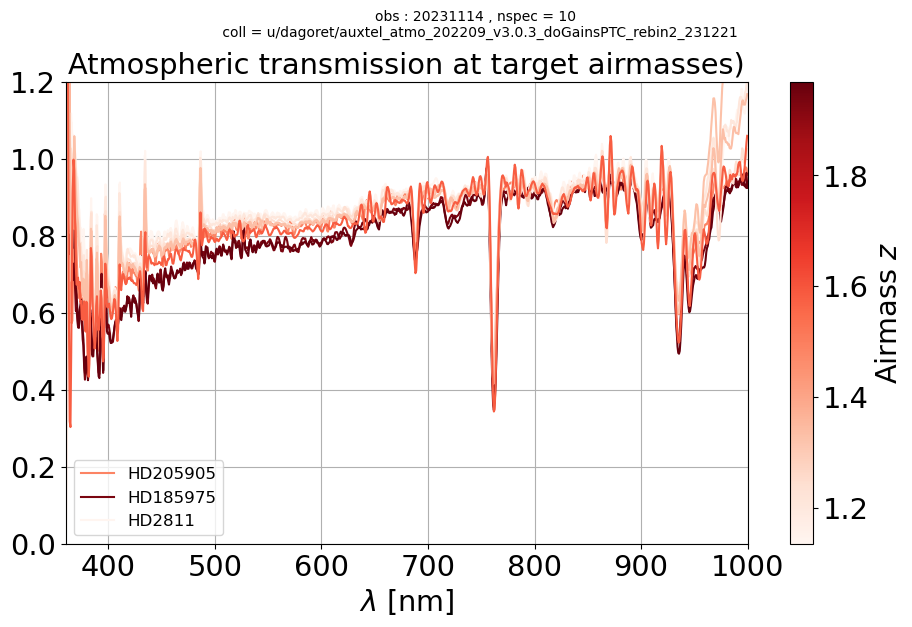

>>> ID.     :  20231115 [2023111500345, 2023111500346, 2023111500352, 2023111500398, 2023111500405, 2023111500413, 2023111500433, 2023111500434, 2023111500448, 2023111500459, 2023111500460, 2023111500466, 2023111500467]
>>> AIRMASS :  20231115 [1.98613788783555, 1.98694117685306, 1.17617582531087, 1.39616648849787, 1.43317905612863, 2.05120301263507, 1.64451061578413, 1.65273779120814, 1.79674680179135, 2.02266366257953, 2.0359608208016, 2.09819897806886, 2.09879626735118]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-16 03:53:51.617495119+00:00  2023111500345  HD185975  0.926591   
2023-11-16 03:55:04.648490696+00:00  2023111500346  HD185975  0.931324   
2023-11-16 04:02:48.568990728+00:00  2023111500352    HD2811  0.966717   
2023-11-16 05:11:59.804999601+00:00  2023111500398    HD2811  0.962322   
2023-11-16 05:20:15.566998468+00:00  2023111500405    HD2811  0.949016   
2023

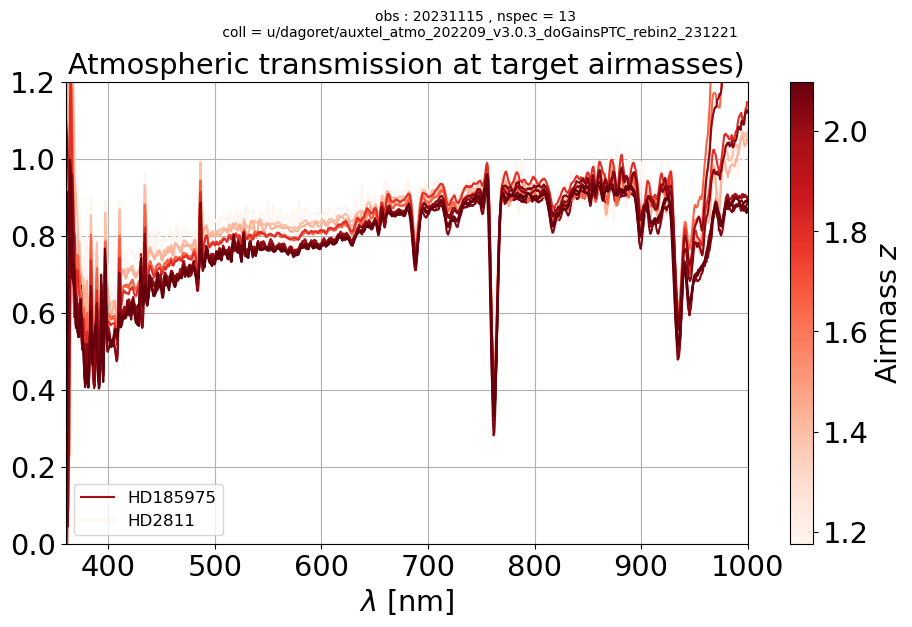

>>> ID.     :  20231116 [2023111600436, 2023111600437, 2023111600493, 2023111600514, 2023111600527, 2023111600548, 2023111600549, 2023111600562, 2023111600563, 2023111600598, 2023111600599, 2023111600613, 2023111600619]
>>> AIRMASS :  20231116 [1.6056508896384, 1.61472813285907, 1.18503470780996, 2.01465530861709, 1.32087843063553, 1.43272055661941, 1.43839364821339, 1.52912888548746, 1.53594694077535, 2.0789822854761, 2.07966474743723, 1.96938174794147, 2.04996710124899]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-17 02:38:12.794492208+00:00  2023111600436  HD205905  0.938460   
2023-11-17 02:39:25.756007989+00:00  2023111600437  HD205905  0.936724   
2023-11-17 04:02:41.239996422+00:00  2023111600493    HD2811  0.959142   
2023-11-17 04:31:31.960006922+00:00  2023111600514  HD185975  0.928801   
2023-11-17 04:48:58.734003294+00:00  2023111600527    HD2811  0.959105   
2023-

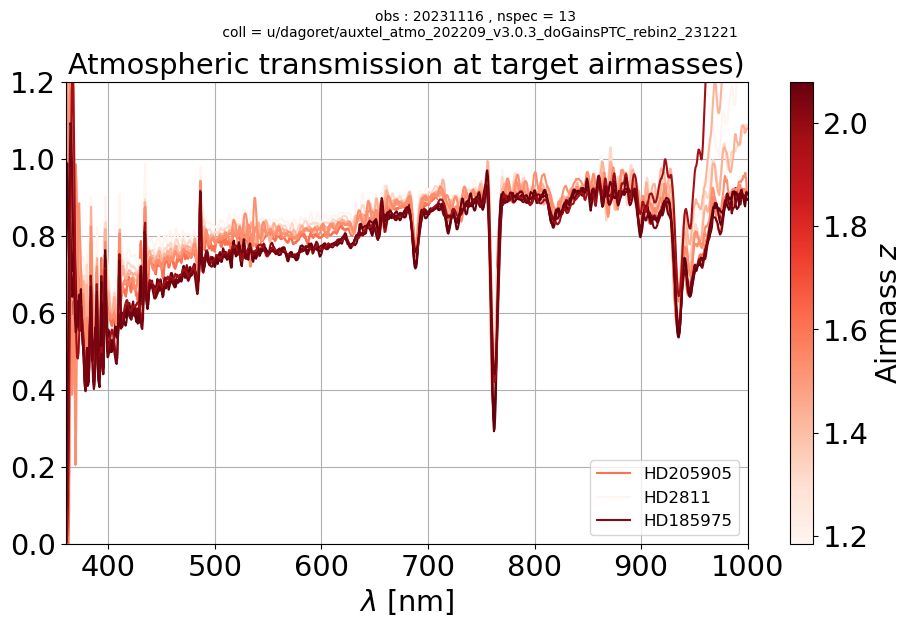

>>> ID.     :  20231120 [2023112000082, 2023112000083, 2023112000113, 2023112000114, 2023112000142, 2023112000163, 2023112000164, 2023112000176, 2023112000177, 2023112000189, 2023112000190, 2023112000202, 2023112000203, 2023112000209, 2023112000210, 2023112000239, 2023112000240, 2023112000266, 2023112000378, 2023112000379]
>>> AIRMASS :  20231120 [1.02965124639104, 1.02996913954069, 1.94400994685639, 1.94476078040974, 1.09460387450384, 1.98023695646798, 1.98103775396734, 1.17552029444915, 1.17826462875008, 1.22132361176201, 1.22460932266256, 1.27507703330845, 1.2789764934228, 2.02377216526679, 2.02457186519696, 1.6470540497264, 1.65533147781872, 1.95600769026649, 2.13996025510354, 2.14015565930435]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-21 01:37:13.904502514+00:00  2023112000082    HD2811  0.984415   
2023-11-21 01:38:26.888507769+00:00  2023112000083    HD2811  0.986465

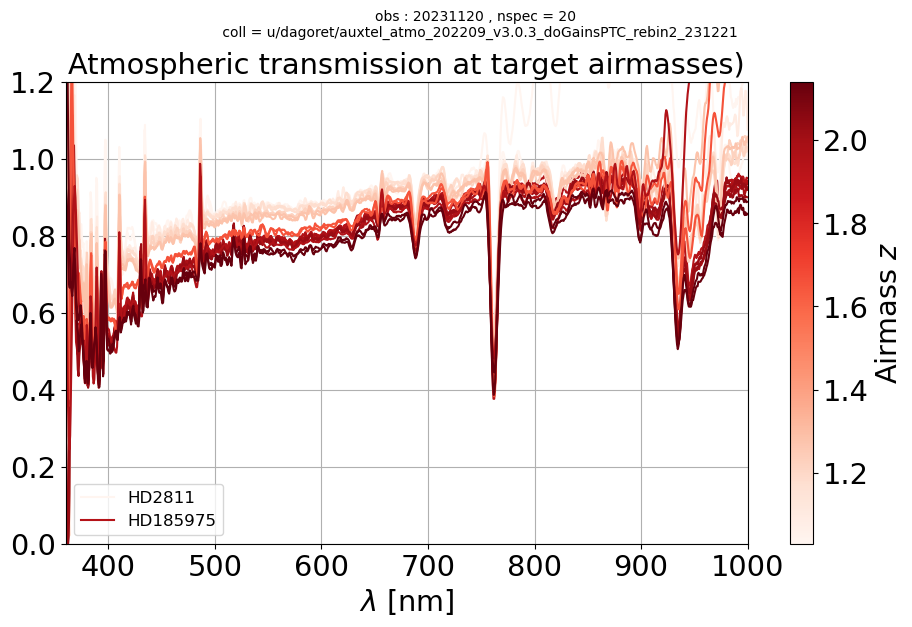

>>> ID.     :  20231127 [2023112700067, 2023112700073, 2023112700074, 2023112700094, 2023112700115, 2023112700116, 2023112700122, 2023112700123, 2023112700147, 2023112700148, 2023112700168, 2023112700175, 2023112700183, 2023112700196, 2023112700211, 2023112700403, 2023112700404]
>>> AIRMASS :  20231127 [1.37033739370972, 1.92142440284357, 1.92212006775784, 1.58714012183517, 1.95607235587472, 1.95684512476475, 1.92981693377834, 1.94395807802772, 1.12654354434594, 1.12869314872288, 1.18243927172824, 2.00055421259165, 1.23275027501265, 1.28646083308191, 1.35963946813355, 2.14256249399399, 2.14268471157553]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-28 01:15:40.665007708+00:00  2023112700067  HD205905  0.984183   
2023-11-28 01:24:21.031494380+00:00  2023112700073  HD185975  0.948983   
2023-11-28 01:25:34.043492589+00:00  2023112700074  HD185975  0.959605   
2023-11-28 01:52:26

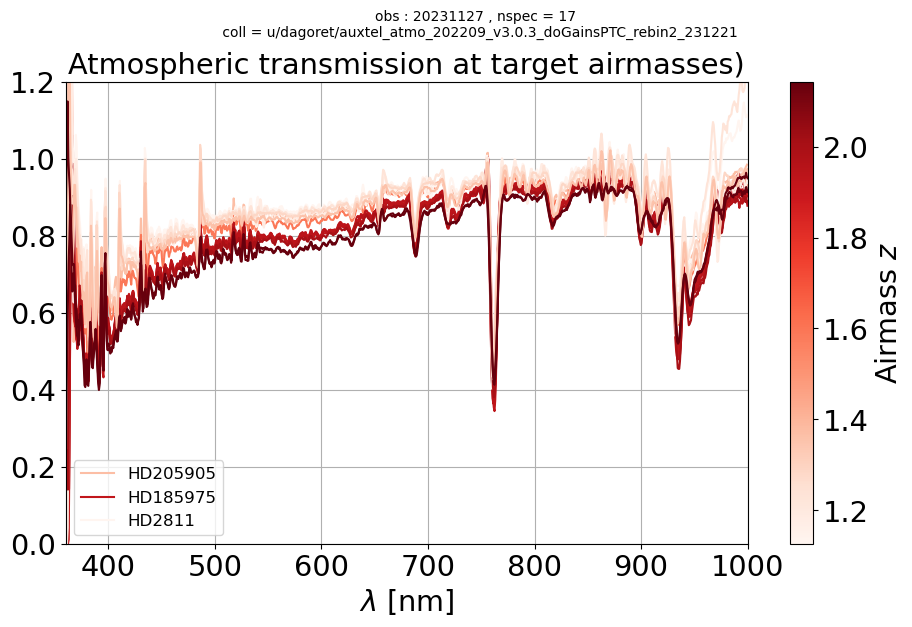

>>> ID.     :  20231128 [2023112800306, 2023112800337, 2023112800344, 2023112800350, 2023112800351, 2023112800387, 2023112800396, 2023112800403, 2023112800409, 2023112800410, 2023112800438, 2023112800439, 2023112800445, 2023112800480, 2023112800481, 2023112800487, 2023112800488]
>>> AIRMASS :  20231128 [1.91654569520835, 1.06719325717717, 1.0764767301782, 1.95825075119908, 1.95902761508848, 1.14227667567622, 1.2948354266279, 2.02758835967186, 1.35861114084195, 1.36345220639526, 2.05845101409023, 2.0591931476228, 1.60018151489937, 2.09086754609941, 2.0915040604888, 2.07450799383192, 2.08855077524966]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-29 01:12:26.106505388+00:00  2023112800306  HD185975  0.957163   
2023-11-29 02:04:09.936497704+00:00  2023112800337    HD2811  0.975161   
2023-11-29 02:12:30.487508933+00:00  2023112800344    HD2811  0.969643   
2023-11-29 02:20:27.539

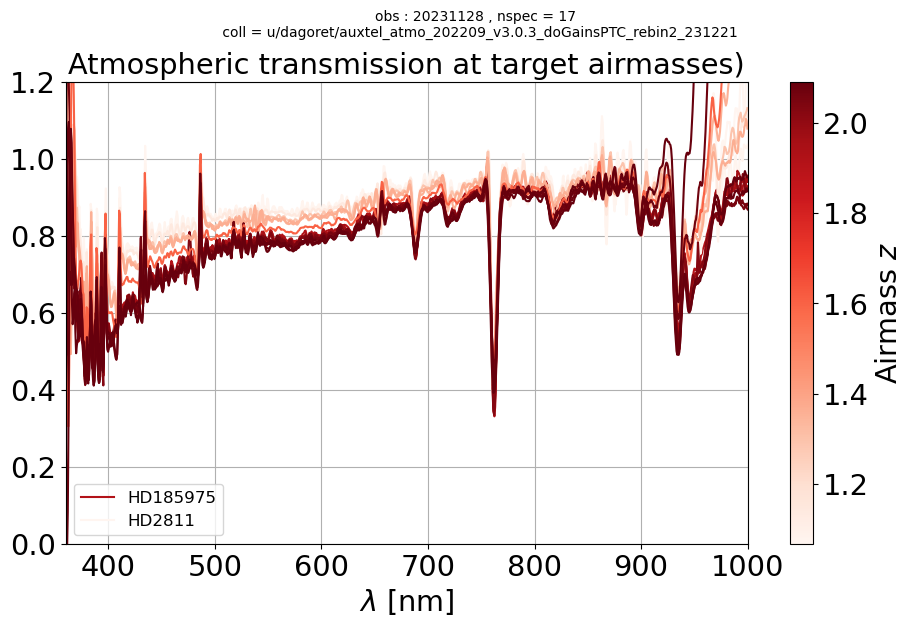

>>> ID.     :  20231129 [2023112900310, 2023112900311, 2023112900317, 2023112900366, 2023112900373, 2023112900380, 2023112900408, 2023112900436, 2023112900465, 2023112900493, 2023112900508]
>>> AIRMASS :  20231129 [1.93641787472087, 1.93715015588567, 1.05692172057992, 1.15809641269543, 1.99264269185798, 1.19899649930844, 1.31102738485376, 1.46201679297201, 2.06506426174543, 1.95630498566047, 2.19082034906294]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-30 01:40:39.339992660+00:00  2023112900310  HD185975  0.918756   
2023-11-30 01:41:52.384997828+00:00  2023112900311  HD185975  0.925081   
2023-11-30 01:49:39.292003446+00:00  2023112900317    HD2811  0.983598   
2023-11-30 02:59:25.426496255+00:00  2023112900366    HD2811  0.977188   
2023-11-30 03:08:26.191008352+00:00  2023112900373  HD185975  0.952746   
2023-11-30 03:17:25.140007279+00:00  2023112900380    HD2811  0.97912

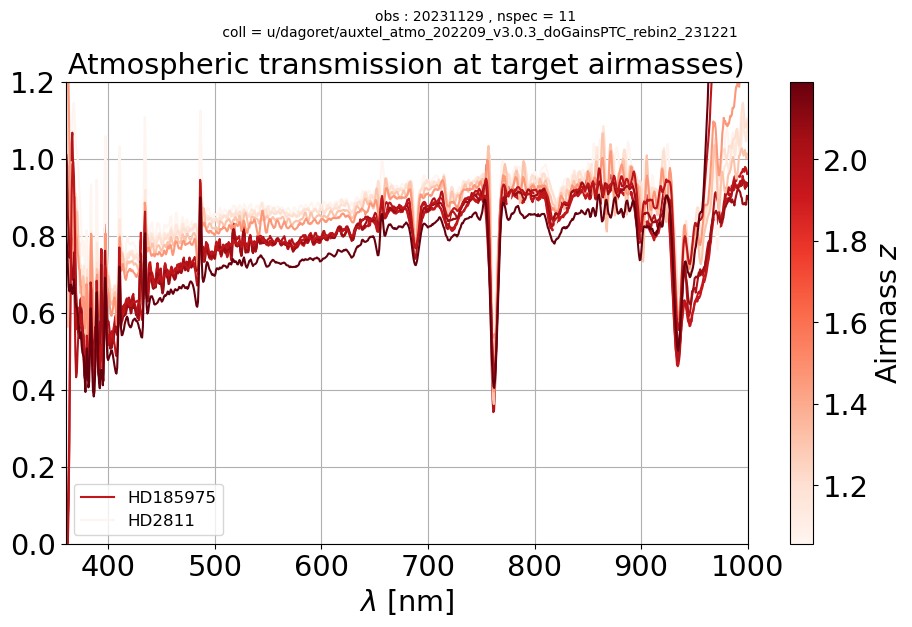

>>> ID.     :  20231130 [2023113000311, 2023113000312, 2023113000318, 2023113000332, 2023113000346, 2023113000347, 2023113000360, 2023113000361, 2023113000461]
>>> AIRMASS :  20231130 [1.04752882896602, 1.04842944679405, 1.05412893751206, 1.07259093309158, 1.09680858369916, 1.09855602469585, 1.1271618358835, 1.12931806928214, 1.59680651247345]
                                                id  TARGET      A1_x  \
DATE-OBS                                                               
2023-12-01 01:34:12.078991513+00:00  2023113000311  HD2811  0.966946   
2023-12-01 01:35:25.130508337+00:00  2023113000312  HD2811  0.977364   
2023-12-01 01:42:32.005497692+00:00  2023113000318  HD2811  0.966812   
2023-12-01 02:01:16.112491234+00:00  2023113000332  HD2811  0.971985   
2023-12-01 02:20:17.255503350+00:00  2023113000346  HD2811  0.969561   
2023-12-01 02:21:30.292502124+00:00  2023113000347  HD2811  0.967816   
2023-12-01 02:39:21.412496521+00:00  2023113000360  HD2811  0.967495   
2023-1

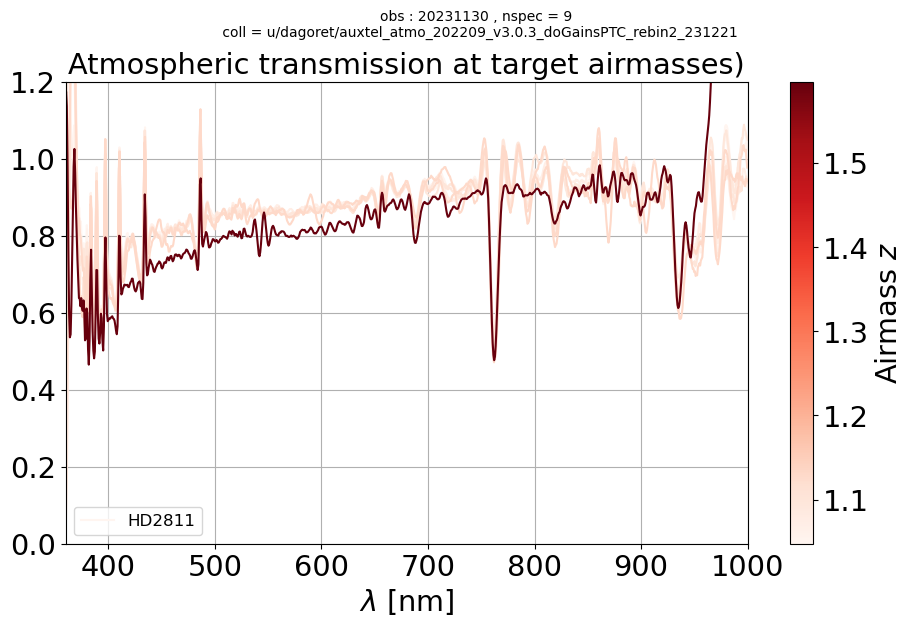

>>> ID.     :  20231204 [2023120400308, 2023120400309, 2023120400378, 2023120400379, 2023120400421, 2023120400434, 2023120400435, 2023120400448, 2023120400449, 2023120400474, 2023120400488, 2023120400489, 2023120400623, 2023120400624]
>>> AIRMASS :  20231204 [1.9480614657494, 1.94882146116799, 1.21439958843962, 1.21760528312472, 2.03951778255777, 1.48317646701871, 1.48945269705585, 1.59070679998468, 1.59829321311402, 1.91384773020259, 2.09776963945996, 2.09836942090847, 2.14227162009967, 2.14238568684147]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-05 01:41:01.864008724+00:00  2023120400308  HD185975  0.941800   
2023-12-05 01:42:14.882495559+00:00  2023120400309  HD185975  0.941085   
2023-12-05 03:03:47.334991940+00:00  2023120400378    HD2811  0.965931   
2023-12-05 03:05:00.343489866+00:00  2023120400379    HD2811  0.984526   
2023-12-05 03:58:20.329495393+00:00  20231204

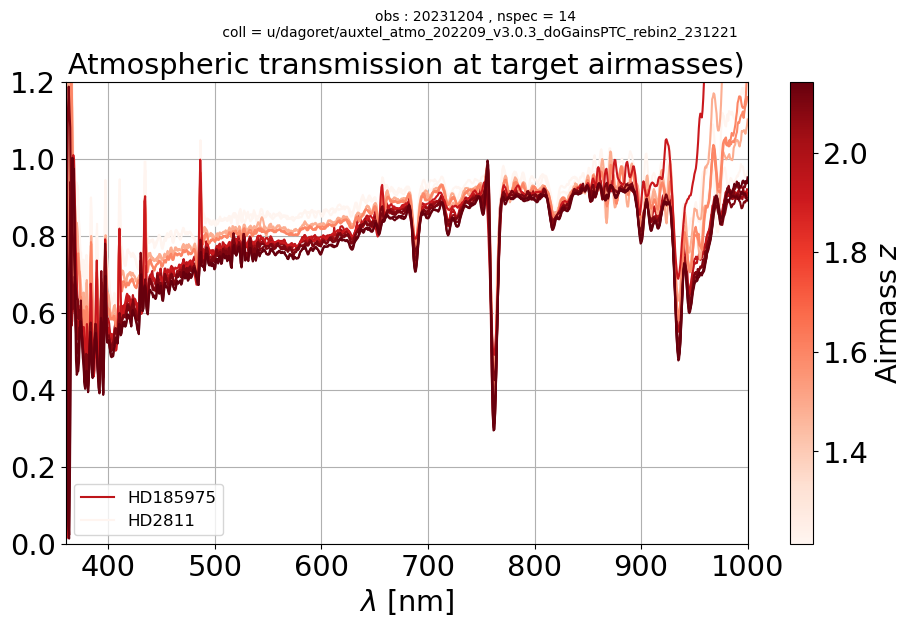

>>> ID.     :  20231205 [2023120500293, 2023120500321, 2023120500322, 2023120500336, 2023120500350, 2023120500383, 2023120500389, 2023120500390, 2023120500442]
>>> AIRMASS :  20231205 [1.93998110374528, 1.09853343878459, 1.10030059270646, 1.13118642329847, 1.16920371425652, 1.24847138976972, 1.27010928086886, 1.27395029809539, 2.10003292480613]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-06 01:24:18.064498385+00:00  2023120500293  HD185975  0.938890   
2023-12-06 02:01:49.710506239+00:00  2023120500321    HD2811  0.974307   
2023-12-06 02:03:02.624003120+00:00  2023120500322    HD2811  0.968731   
2023-12-06 02:21:57.299001189+00:00  2023120500336    HD2811  0.966838   
2023-12-06 02:41:02.213507697+00:00  2023120500350    HD2811  0.970415   
2023-12-06 03:12:08.042500930+00:00  2023120500383    HD2811  0.966495   
2023-12-06 03:19:15.006505334+00:00  2023120500389    HD2811 

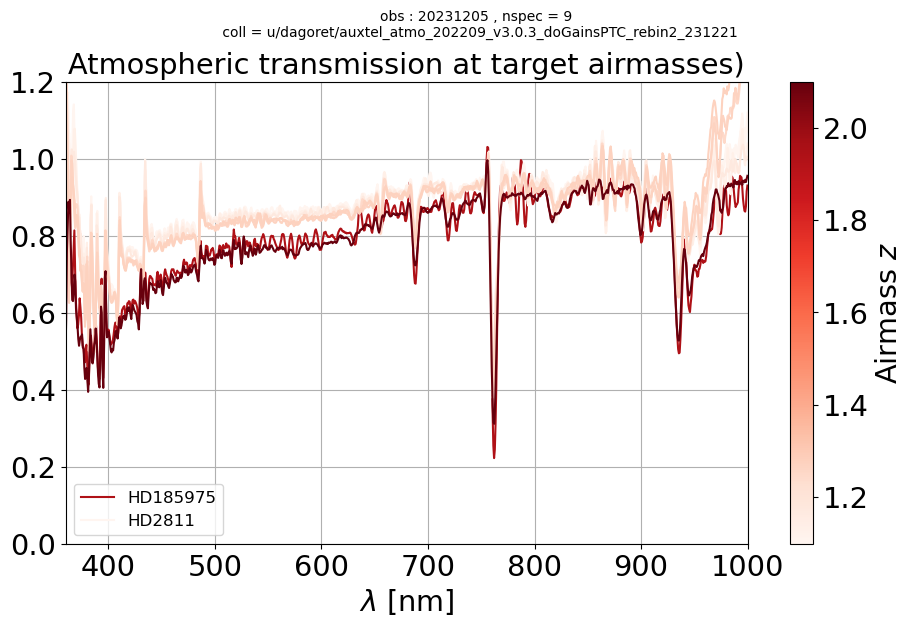

>>> ID.     :  20231206 [2023120600077, 2023120600078, 2023120600106, 2023120600113, 2023120600134, 2023120600182, 2023120600183, 2023120600189, 2023120600190, 2023120600357, 2023120600358]
>>> AIRMASS :  20231206 [1.22576037871197, 1.22909623847932, 1.34670045037051, 2.04080550408909, 1.57580300610864, 2.09138533508202, 2.09201874648357, 2.09154421486717, 2.10580792040668, 2.14424818945613, 2.14422439745313]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-07 03:00:10.879496091+00:00  2023120600077    HD2811  0.963789   
2023-12-07 03:01:23.800490341+00:00  2023120600078    HD2811  0.968235   
2023-12-07 03:37:19.026997552+00:00  2023120600106    HD2811  0.965942   
2023-12-07 03:52:50.598998771+00:00  2023120600113  HD185975  0.944279   
2023-12-07 04:24:35.238496669+00:00  2023120600134    HD2811  0.955324   
2023-12-07 05:16:26.020502425+00:00  2023120600182  HD185975  0.93963

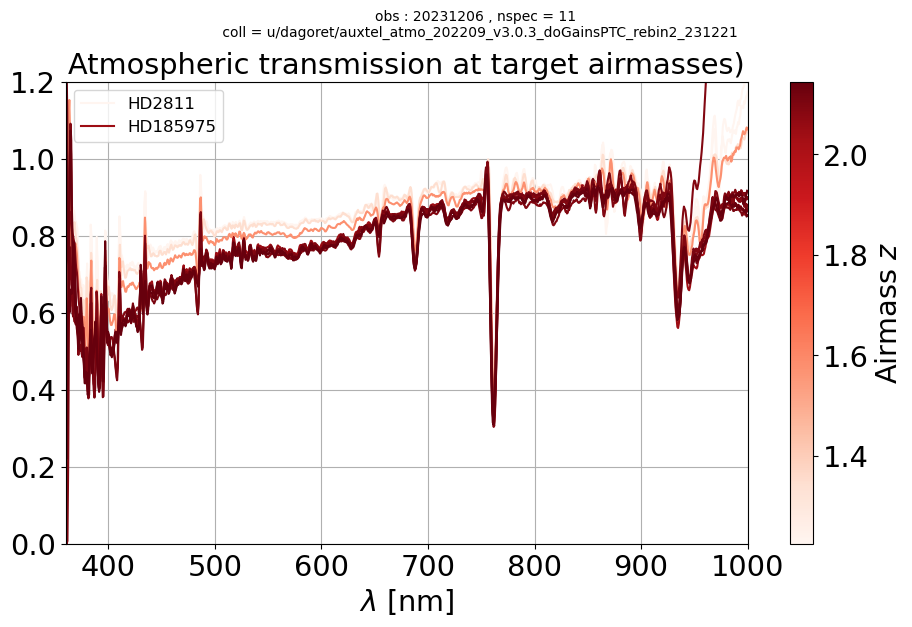

>>> ID.     :  20231207 [2023120700289, 2023120700358, 2023120700366, 2023120700399, 2023120700420, 2023120700421, 2023120700434, 2023120700435]
>>> AIRMASS :  20231207 [1.93094174377831, 1.16839388596346, 1.99681450280567, 1.27878344368903, 1.38806268962779, 1.39323843263595, 1.47569331882934, 1.48188142264463]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-08 01:01:44.209006145+00:00  2023120700289  HD185975  0.949514   
2023-12-08 02:32:48.268490226+00:00  2023120700358    HD2811  0.976643   
2023-12-08 02:43:11.485505028+00:00  2023120700366  HD185975  0.943156   
2023-12-08 03:14:06.988503349+00:00  2023120700399    HD2811  0.968286   
2023-12-08 03:43:37.521992488+00:00  2023120700420    HD2811  0.965867   
2023-12-08 03:44:50.441503941+00:00  2023120700421    HD2811  0.964335   
2023-12-08 04:02:32.741498325+00:00  2023120700434    HD2811  0.957810   
2023-12-08 04:03:45.

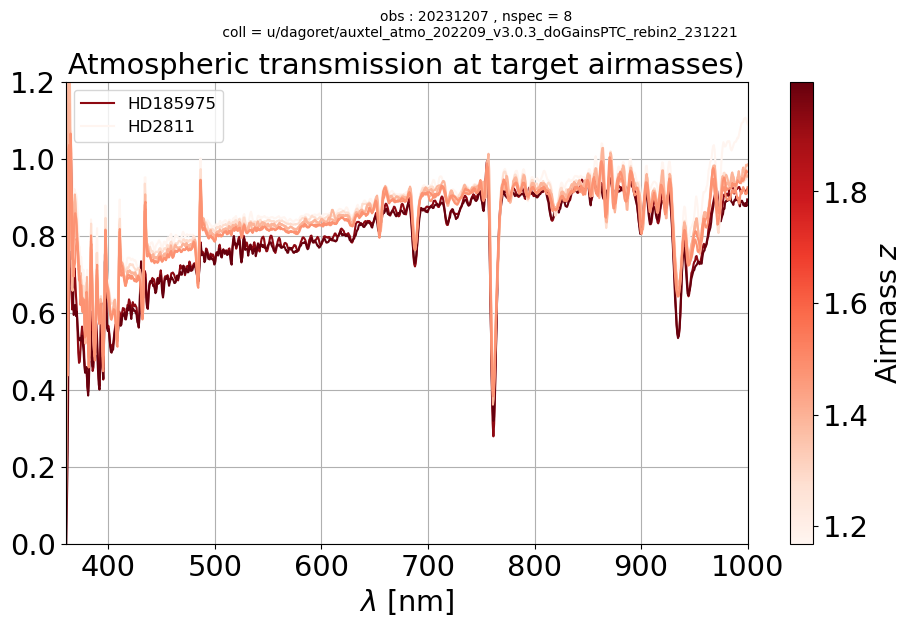

In [61]:
count = 0
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]

    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    print(df_sel)
    
    if N > 1:
        plot_atmtransmission(filtered_spectra, [spec.airmass for spec in filtered_spectra],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS)
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")


## Plot atmospheric transmissions for airmass = 1

>>> ID.     :  20230927 [2023092700282, 2023092700283, 2023092700290, 2023092700298, 2023092700309, 2023092700350, 2023092700351, 2023092700398, 2023092700407, 2023092700415, 2023092700430, 2023092700431, 2023092700439, 2023092700446, 2023092700447, 2023092700455, 2023092700462, 2023092700463, 2023092700470]
>>> AIRMASS :  20230927 [1.83707260459048, 1.83710176298451, 1.06165209982741, 1.35193009732497, 1.36992910794979, 1.08514093171995, 1.08608779504626, 1.68337977064928, 1.14615471741572, 1.16258780333534, 1.87167339732133, 1.87911565892422, 1.21101689891644, 1.08947155443484, 1.0873479181482, 1.88459168098913, 2.11855855193392, 2.1283254858779, 1.0292164208128]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-09-28 01:09:07.731001435+00:00  2023092700282  HD185975  0.919844   
2023-09-28 01:10:20.660995968+00:00  2023092700283  HD185975  0.922407   
2023-09-28 01:17:58.019506853+

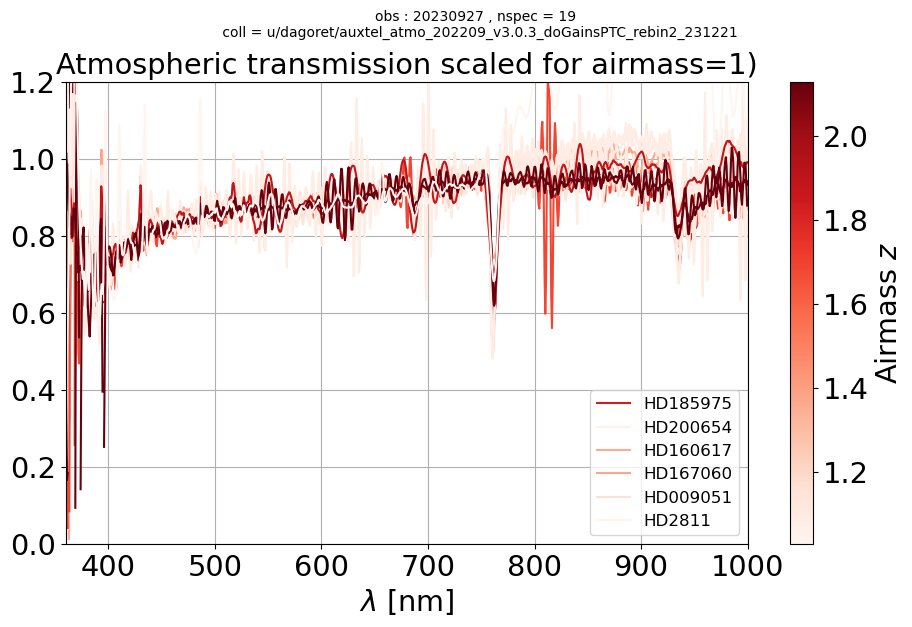

>>> ID.     :  20230928 [2023092800161, 2023092800176, 2023092800177, 2023092800184, 2023092800227, 2023092800259, 2023092800266, 2023092800267, 2023092800274, 2023092800275, 2023092800307, 2023092800332, 2023092800333, 2023092800356, 2023092800357]
>>> AIRMASS :  20230928 [2.04469107631757, 1.36733165045617, 1.37342852379464, 1.36684918200253, 1.0876246409154, 1.09381754237656, 2.18969039769996, 2.20907704503936, 1.15258238325182, 1.15491780189978, 1.977967514831, 1.27319274714756, 1.27727234931251, 1.36079976280231, 1.36561333955159]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-09-29 01:06:36.947508641+00:00  2023092800161  HD009051  0.937635   
2023-09-29 01:26:24.209004025+00:00  2023092800176  HD160617  0.982190   
2023-09-29 01:27:49.985500794+00:00  2023092800177  HD160617  0.988114   
2023-09-29 01:35:18.622498139+00:00  2023092800184  HD167060  0.943157   
2023-09-29 02:

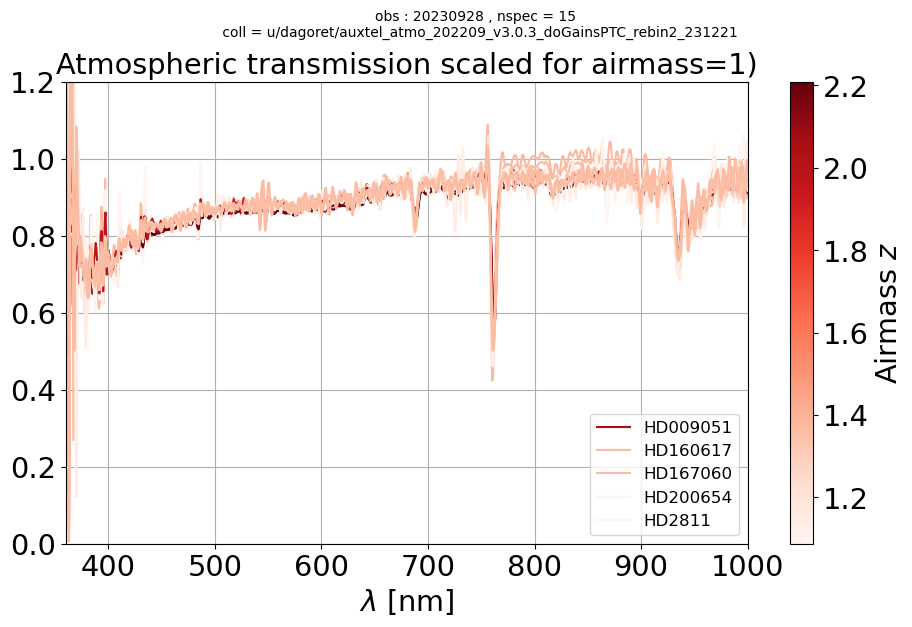

>>> ID.     :  20231010 [2023101000352, 2023101000358, 2023101000370, 2023101000371, 2023101000384, 2023101000396, 2023101000403, 2023101000443, 2023101000444, 2023101000451, 2023101000507, 2023101000508, 2023101000514, 2023101000521, 2023101000522, 2023101000535, 2023101000536, 2023101000543, 2023101000556, 2023101000571, 2023101000584, 2023101000609, 2023101000610, 2023101000631, 2023101000638]
>>> AIRMASS :  20231010 [1.86476809846317, 1.07437135210369, 1.10355353925367, 1.10593670901751, 1.14428538227033, 1.18655919323918, 1.8944915861701, 1.3764673369979, 1.38239441190885, 1.03586227236182, 1.99031477880307, 1.99111889352817, 1.19033207076426, 1.20978824997625, 1.21294124410385, 1.26062100303697, 1.2642128400857, 2.02030190318836, 1.3519381421359, 1.43435473069881, 1.52112656964602, 2.06658133089254, 2.06730530711587, 1.84454097431272, 1.92083396593776]
                                                id    TARGET      A1_x  \
DATE-OBS                                               

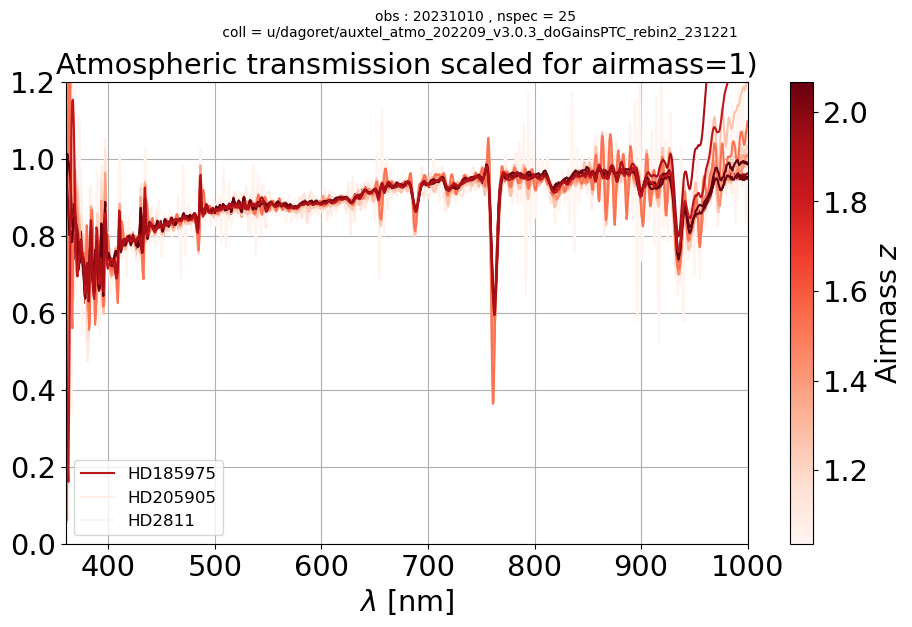

>>> ID.     :  20231107 [2023110700364, 2023110700384, 2023110700385, 2023110700426, 2023110700427, 2023110700434, 2023110700439, 2023110700440, 2023110700452, 2023110700453, 2023110700486, 2023110700493, 2023110700494, 2023110700500, 2023110700501, 2023110700530, 2023110700550, 2023110700556, 2023110700557, 2023110700571]
>>> AIRMASS :  20231107 [1.08150410157688, 1.97467446800652, 1.9754688916128, 1.22863191366979, 1.23201099929145, 2.01320459088301, 1.27807733606266, 1.28200841680642, 1.34768129940907, 1.35239937382119, 1.54678861313199, 2.06369773141, 2.06443148911837, 1.65605846678763, 1.66442527123212, 1.91953405499685, 2.16652078072684, 2.10331080531695, 2.10388585205142, 1.00759612281391]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-08 03:39:13.397002204+00:00  2023110700364    HD2811  0.993737   
2023-11-08 04:07:54.241501484+00:00  2023110700384  HD185975  0.944763  

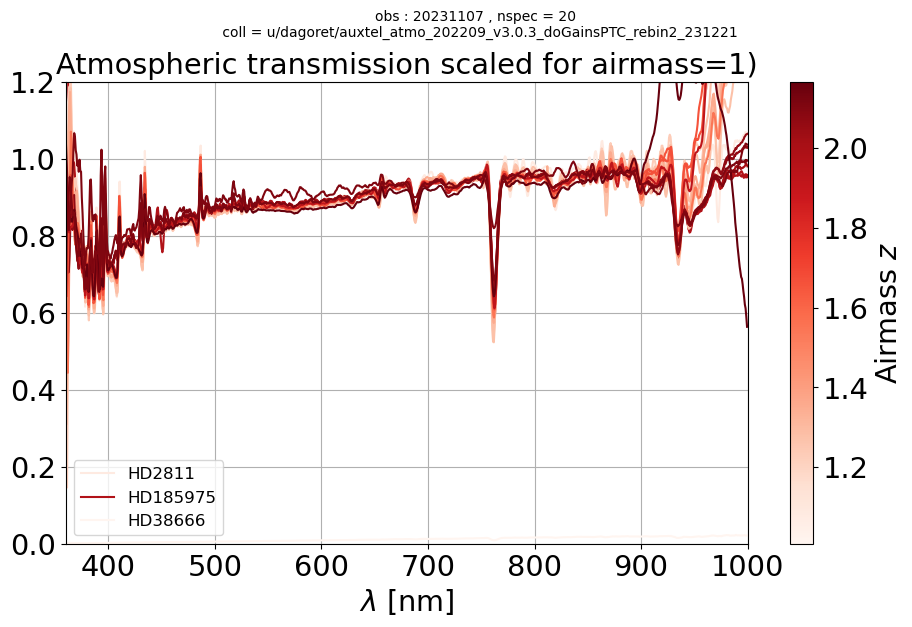

>>> ID.     :  20231108 [2023110800278]
>>> AIRMASS :  20231108 [1.85868971794992]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-09 00:23:14.899493940+00:00  2023110800278  HD185975  1.005696   

                                     ozone [db]_x  PWV [mm]_x    VAOD_x  \
DATE-OBS                                                                  
2023-11-09 00:23:14.899493940+00:00    301.294905    3.082407  0.031803   

                                     filtered  
DATE-OBS                                       
2023-11-09 00:23:14.899493940+00:00      True  
 
 /////// SKIPP 2023110800278 

>>> ID.     :  20231113 [2023111300251, 2023111300252, 2023111300260, 2023111300292, 2023111300300, 2023111300301]
>>> AIRMASS :  20231113 [1.02936114100246, 1.02966037157531, 1.47496993155041, 1.06896415431243, 1.08604637715068, 1.08763496545079]
                                           

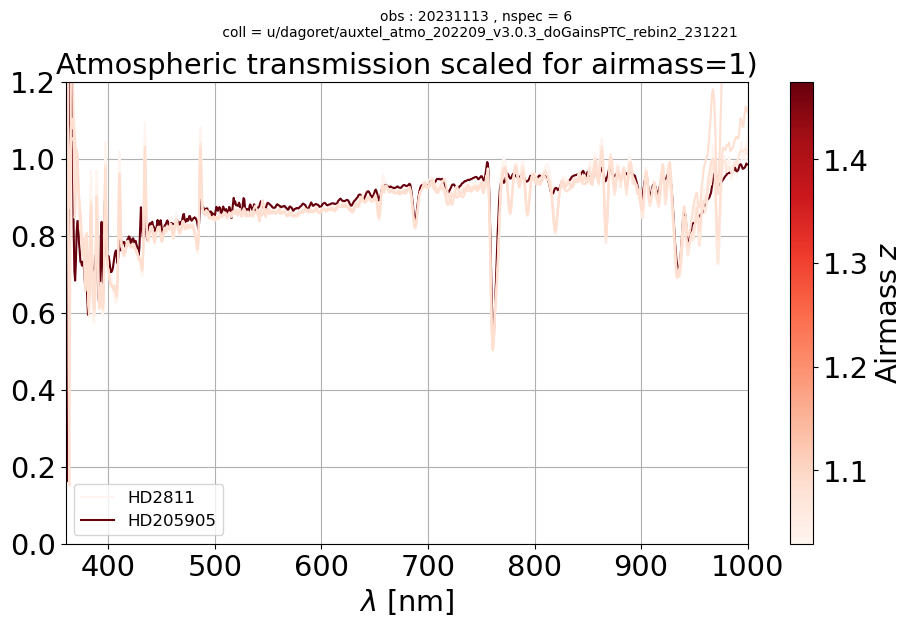

>>> ID.     :  20231114 [2023111400346, 2023111400353, 2023111400393, 2023111400405, 2023111400406, 2023111400430, 2023111400437, 2023111400445, 2023111400446, 2023111400481]
>>> AIRMASS :  20231114 [1.48536546911215, 1.93397731309342, 1.96885815320162, 1.13480244847674, 1.13705633664655, 1.20577985384641, 1.24202158944147, 1.32825925603229, 1.33275624220698, 1.57867164434887]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-15 02:28:09.797995195+00:00  2023111400346  HD205905  1.028264   
2023-11-15 02:36:51.471991880+00:00  2023111400353  HD185975  0.956088   
2023-11-15 03:31:27.117993175+00:00  2023111400393  HD185975  0.944438   
2023-11-15 03:46:28.775498681+00:00  2023111400405    HD2811  0.972225   
2023-11-15 03:47:41.706999325+00:00  2023111400406    HD2811  0.967425   
2023-11-15 04:19:04.008491142+00:00  2023111400430    HD2811  0.966545   
2023-11-15 04:32:27.27649964

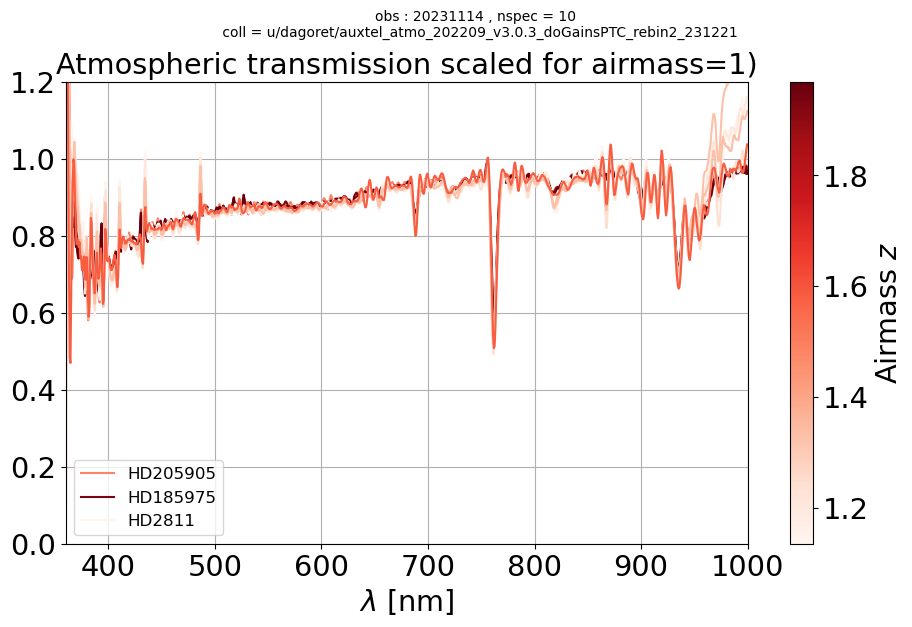

>>> ID.     :  20231115 [2023111500345, 2023111500346, 2023111500352, 2023111500398, 2023111500405, 2023111500413, 2023111500433, 2023111500434, 2023111500448, 2023111500459, 2023111500460, 2023111500466, 2023111500467]
>>> AIRMASS :  20231115 [1.98613788783555, 1.98694117685306, 1.17617582531087, 1.39616648849787, 1.43317905612863, 2.05120301263507, 1.64451061578413, 1.65273779120814, 1.79674680179135, 2.02266366257953, 2.0359608208016, 2.09819897806886, 2.09879626735118]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-16 03:53:51.617495119+00:00  2023111500345  HD185975  0.926591   
2023-11-16 03:55:04.648490696+00:00  2023111500346  HD185975  0.931324   
2023-11-16 04:02:48.568990728+00:00  2023111500352    HD2811  0.966717   
2023-11-16 05:11:59.804999601+00:00  2023111500398    HD2811  0.962322   
2023-11-16 05:20:15.566998468+00:00  2023111500405    HD2811  0.949016   
2023

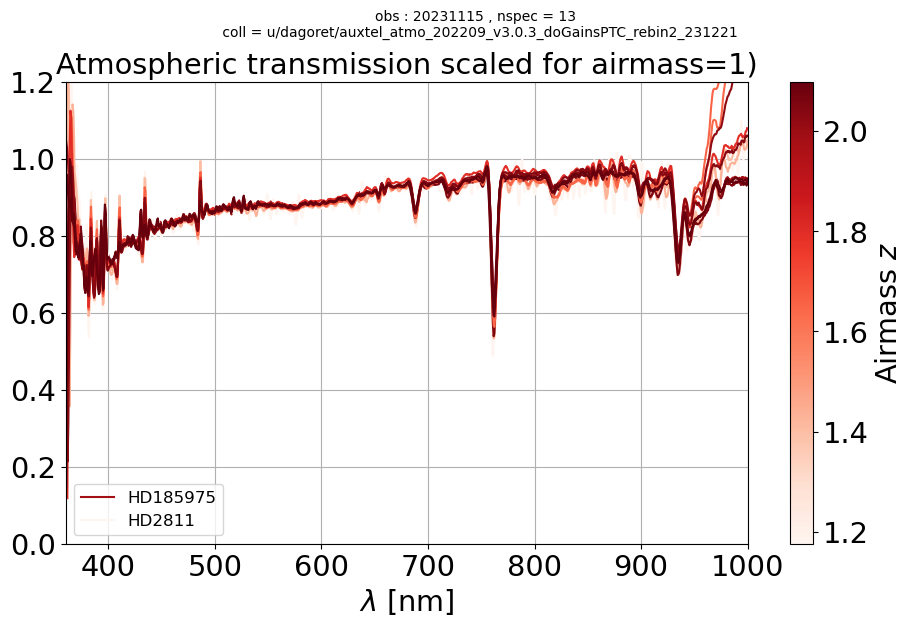

>>> ID.     :  20231116 [2023111600436, 2023111600437, 2023111600493, 2023111600514, 2023111600527, 2023111600548, 2023111600549, 2023111600562, 2023111600563, 2023111600598, 2023111600599, 2023111600613, 2023111600619]
>>> AIRMASS :  20231116 [1.6056508896384, 1.61472813285907, 1.18503470780996, 2.01465530861709, 1.32087843063553, 1.43272055661941, 1.43839364821339, 1.52912888548746, 1.53594694077535, 2.0789822854761, 2.07966474743723, 1.96938174794147, 2.04996710124899]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-17 02:38:12.794492208+00:00  2023111600436  HD205905  0.938460   
2023-11-17 02:39:25.756007989+00:00  2023111600437  HD205905  0.936724   
2023-11-17 04:02:41.239996422+00:00  2023111600493    HD2811  0.959142   
2023-11-17 04:31:31.960006922+00:00  2023111600514  HD185975  0.928801   
2023-11-17 04:48:58.734003294+00:00  2023111600527    HD2811  0.959105   
2023-

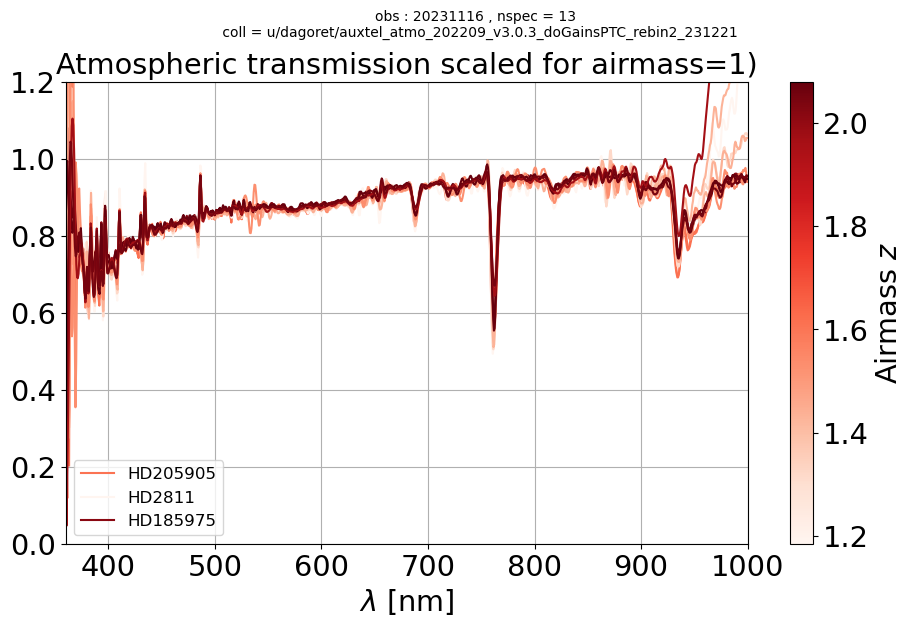

>>> ID.     :  20231120 [2023112000082, 2023112000083, 2023112000113, 2023112000114, 2023112000142, 2023112000163, 2023112000164, 2023112000176, 2023112000177, 2023112000189, 2023112000190, 2023112000202, 2023112000203, 2023112000209, 2023112000210, 2023112000239, 2023112000240, 2023112000266, 2023112000378, 2023112000379]
>>> AIRMASS :  20231120 [1.02965124639104, 1.02996913954069, 1.94400994685639, 1.94476078040974, 1.09460387450384, 1.98023695646798, 1.98103775396734, 1.17552029444915, 1.17826462875008, 1.22132361176201, 1.22460932266256, 1.27507703330845, 1.2789764934228, 2.02377216526679, 2.02457186519696, 1.6470540497264, 1.65533147781872, 1.95600769026649, 2.13996025510354, 2.14015565930435]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-21 01:37:13.904502514+00:00  2023112000082    HD2811  0.984415   
2023-11-21 01:38:26.888507769+00:00  2023112000083    HD2811  0.986465

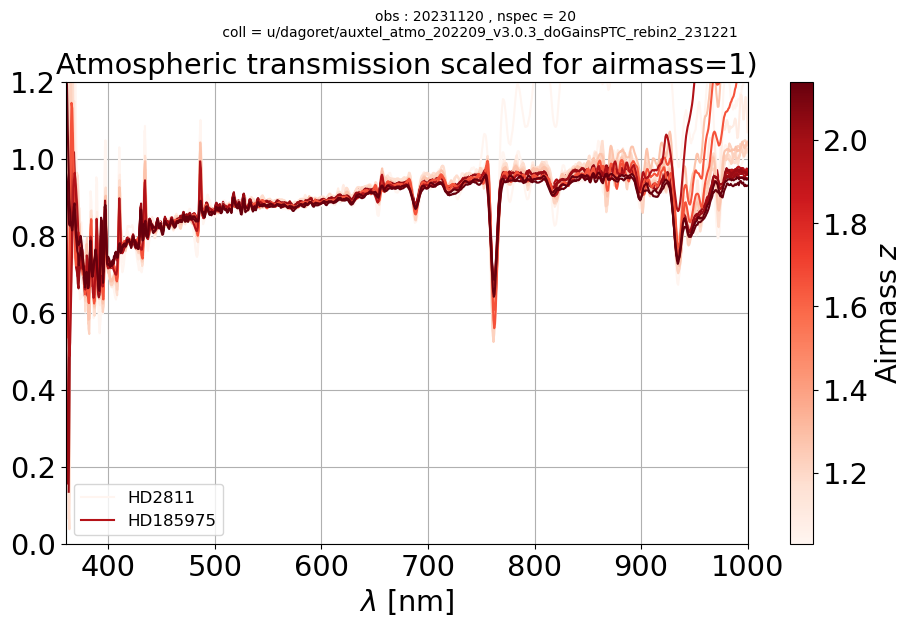

>>> ID.     :  20231127 [2023112700067, 2023112700073, 2023112700074, 2023112700094, 2023112700115, 2023112700116, 2023112700122, 2023112700123, 2023112700147, 2023112700148, 2023112700168, 2023112700175, 2023112700183, 2023112700196, 2023112700211, 2023112700403, 2023112700404]
>>> AIRMASS :  20231127 [1.37033739370972, 1.92142440284357, 1.92212006775784, 1.58714012183517, 1.95607235587472, 1.95684512476475, 1.92981693377834, 1.94395807802772, 1.12654354434594, 1.12869314872288, 1.18243927172824, 2.00055421259165, 1.23275027501265, 1.28646083308191, 1.35963946813355, 2.14256249399399, 2.14268471157553]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-28 01:15:40.665007708+00:00  2023112700067  HD205905  0.984183   
2023-11-28 01:24:21.031494380+00:00  2023112700073  HD185975  0.948983   
2023-11-28 01:25:34.043492589+00:00  2023112700074  HD185975  0.959605   
2023-11-28 01:52:26

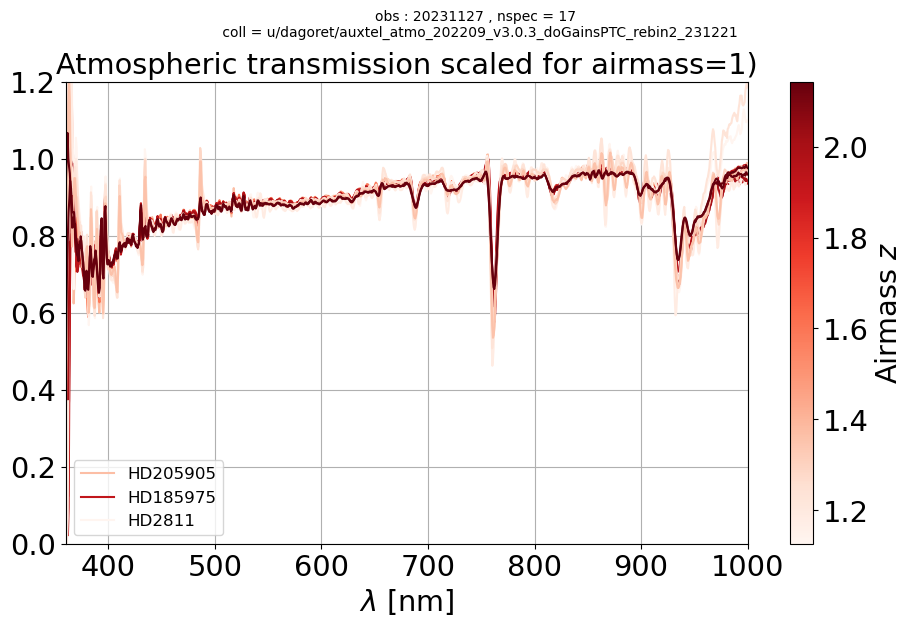

>>> ID.     :  20231128 [2023112800306, 2023112800337, 2023112800344, 2023112800350, 2023112800351, 2023112800387, 2023112800396, 2023112800403, 2023112800409, 2023112800410, 2023112800438, 2023112800439, 2023112800445, 2023112800480, 2023112800481, 2023112800487, 2023112800488]
>>> AIRMASS :  20231128 [1.91654569520835, 1.06719325717717, 1.0764767301782, 1.95825075119908, 1.95902761508848, 1.14227667567622, 1.2948354266279, 2.02758835967186, 1.35861114084195, 1.36345220639526, 2.05845101409023, 2.0591931476228, 1.60018151489937, 2.09086754609941, 2.0915040604888, 2.07450799383192, 2.08855077524966]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-29 01:12:26.106505388+00:00  2023112800306  HD185975  0.957163   
2023-11-29 02:04:09.936497704+00:00  2023112800337    HD2811  0.975161   
2023-11-29 02:12:30.487508933+00:00  2023112800344    HD2811  0.969643   
2023-11-29 02:20:27.539

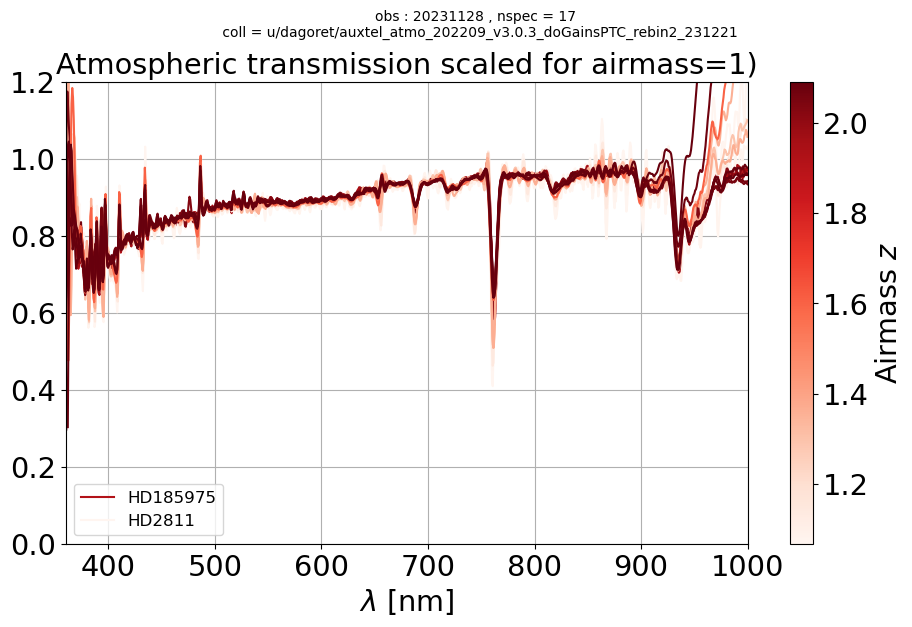

>>> ID.     :  20231129 [2023112900310, 2023112900311, 2023112900317, 2023112900366, 2023112900373, 2023112900380, 2023112900408, 2023112900436, 2023112900465, 2023112900493, 2023112900508]
>>> AIRMASS :  20231129 [1.93641787472087, 1.93715015588567, 1.05692172057992, 1.15809641269543, 1.99264269185798, 1.19899649930844, 1.31102738485376, 1.46201679297201, 2.06506426174543, 1.95630498566047, 2.19082034906294]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-11-30 01:40:39.339992660+00:00  2023112900310  HD185975  0.918756   
2023-11-30 01:41:52.384997828+00:00  2023112900311  HD185975  0.925081   
2023-11-30 01:49:39.292003446+00:00  2023112900317    HD2811  0.983598   
2023-11-30 02:59:25.426496255+00:00  2023112900366    HD2811  0.977188   
2023-11-30 03:08:26.191008352+00:00  2023112900373  HD185975  0.952746   
2023-11-30 03:17:25.140007279+00:00  2023112900380    HD2811  0.97912

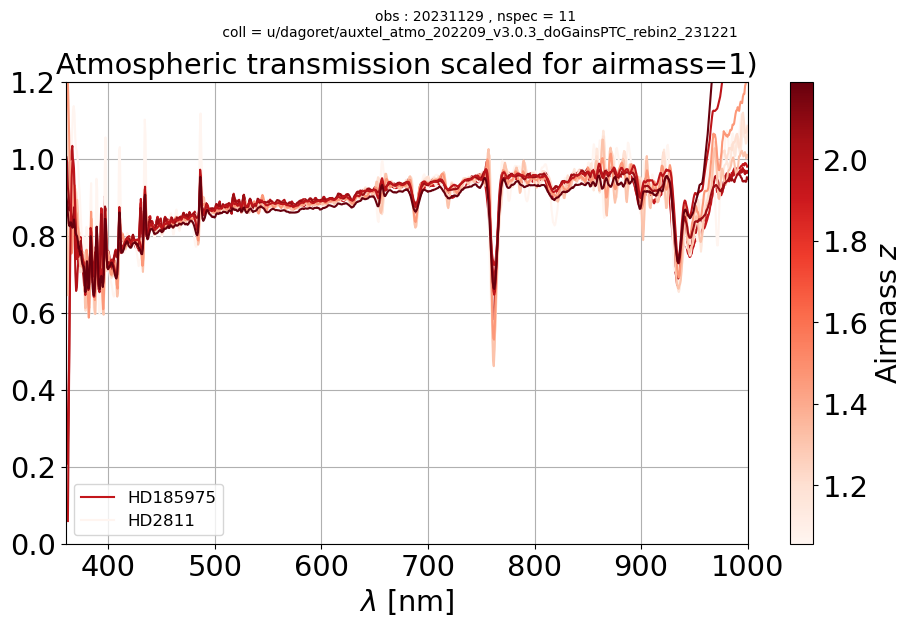

>>> ID.     :  20231130 [2023113000311, 2023113000312, 2023113000318, 2023113000332, 2023113000346, 2023113000347, 2023113000360, 2023113000361, 2023113000461]
>>> AIRMASS :  20231130 [1.04752882896602, 1.04842944679405, 1.05412893751206, 1.07259093309158, 1.09680858369916, 1.09855602469585, 1.1271618358835, 1.12931806928214, 1.59680651247345]
                                                id  TARGET      A1_x  \
DATE-OBS                                                               
2023-12-01 01:34:12.078991513+00:00  2023113000311  HD2811  0.966946   
2023-12-01 01:35:25.130508337+00:00  2023113000312  HD2811  0.977364   
2023-12-01 01:42:32.005497692+00:00  2023113000318  HD2811  0.966812   
2023-12-01 02:01:16.112491234+00:00  2023113000332  HD2811  0.971985   
2023-12-01 02:20:17.255503350+00:00  2023113000346  HD2811  0.969561   
2023-12-01 02:21:30.292502124+00:00  2023113000347  HD2811  0.967816   
2023-12-01 02:39:21.412496521+00:00  2023113000360  HD2811  0.967495   
2023-1

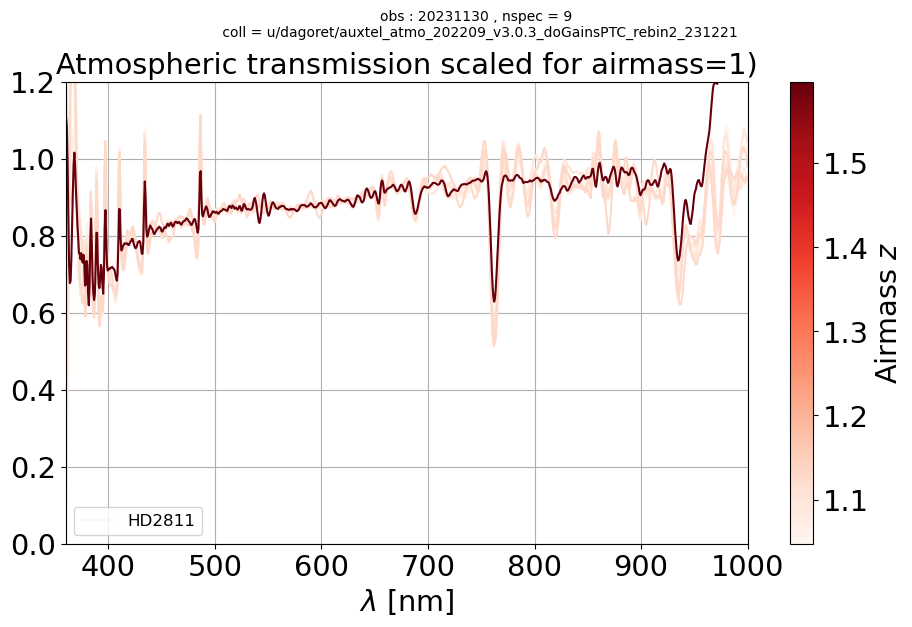

>>> ID.     :  20231204 [2023120400308, 2023120400309, 2023120400378, 2023120400379, 2023120400421, 2023120400434, 2023120400435, 2023120400448, 2023120400449, 2023120400474, 2023120400488, 2023120400489, 2023120400623, 2023120400624]
>>> AIRMASS :  20231204 [1.9480614657494, 1.94882146116799, 1.21439958843962, 1.21760528312472, 2.03951778255777, 1.48317646701871, 1.48945269705585, 1.59070679998468, 1.59829321311402, 1.91384773020259, 2.09776963945996, 2.09836942090847, 2.14227162009967, 2.14238568684147]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-05 01:41:01.864008724+00:00  2023120400308  HD185975  0.941800   
2023-12-05 01:42:14.882495559+00:00  2023120400309  HD185975  0.941085   
2023-12-05 03:03:47.334991940+00:00  2023120400378    HD2811  0.965931   
2023-12-05 03:05:00.343489866+00:00  2023120400379    HD2811  0.984526   
2023-12-05 03:58:20.329495393+00:00  20231204

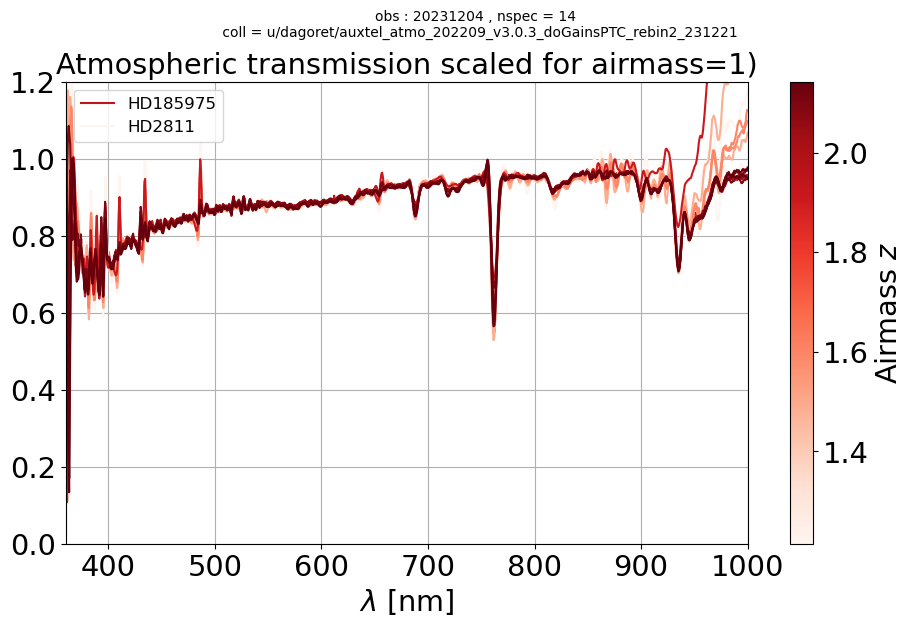

>>> ID.     :  20231205 [2023120500293, 2023120500321, 2023120500322, 2023120500336, 2023120500350, 2023120500383, 2023120500389, 2023120500390, 2023120500442]
>>> AIRMASS :  20231205 [1.93998110374528, 1.09853343878459, 1.10030059270646, 1.13118642329847, 1.16920371425652, 1.24847138976972, 1.27010928086886, 1.27395029809539, 2.10003292480613]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-06 01:24:18.064498385+00:00  2023120500293  HD185975  0.938890   
2023-12-06 02:01:49.710506239+00:00  2023120500321    HD2811  0.974307   
2023-12-06 02:03:02.624003120+00:00  2023120500322    HD2811  0.968731   
2023-12-06 02:21:57.299001189+00:00  2023120500336    HD2811  0.966838   
2023-12-06 02:41:02.213507697+00:00  2023120500350    HD2811  0.970415   
2023-12-06 03:12:08.042500930+00:00  2023120500383    HD2811  0.966495   
2023-12-06 03:19:15.006505334+00:00  2023120500389    HD2811 

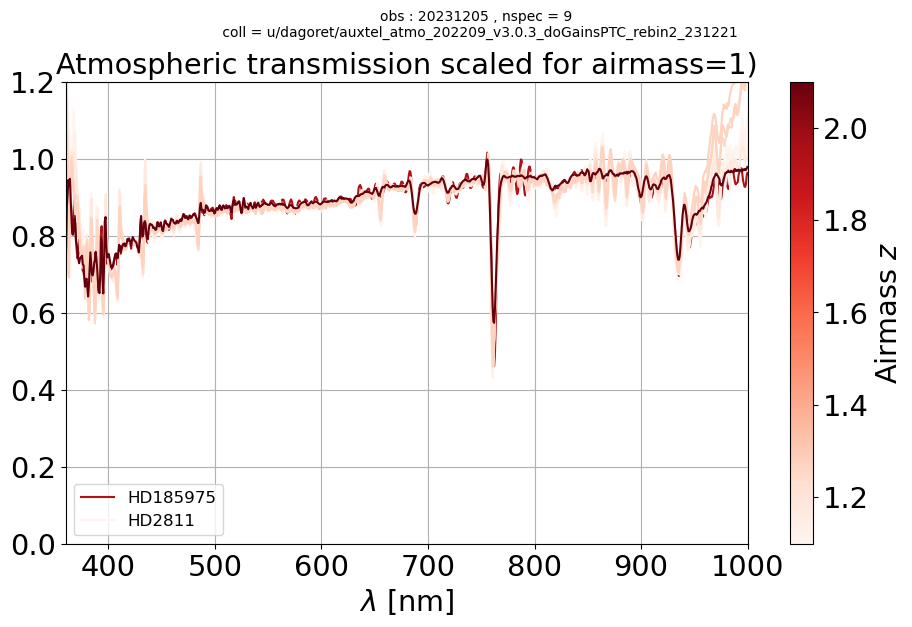

>>> ID.     :  20231206 [2023120600077, 2023120600078, 2023120600106, 2023120600113, 2023120600134, 2023120600182, 2023120600183, 2023120600189, 2023120600190, 2023120600357, 2023120600358]
>>> AIRMASS :  20231206 [1.22576037871197, 1.22909623847932, 1.34670045037051, 2.04080550408909, 1.57580300610864, 2.09138533508202, 2.09201874648357, 2.09154421486717, 2.10580792040668, 2.14424818945613, 2.14422439745313]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-07 03:00:10.879496091+00:00  2023120600077    HD2811  0.963789   
2023-12-07 03:01:23.800490341+00:00  2023120600078    HD2811  0.968235   
2023-12-07 03:37:19.026997552+00:00  2023120600106    HD2811  0.965942   
2023-12-07 03:52:50.598998771+00:00  2023120600113  HD185975  0.944279   
2023-12-07 04:24:35.238496669+00:00  2023120600134    HD2811  0.955324   
2023-12-07 05:16:26.020502425+00:00  2023120600182  HD185975  0.93963

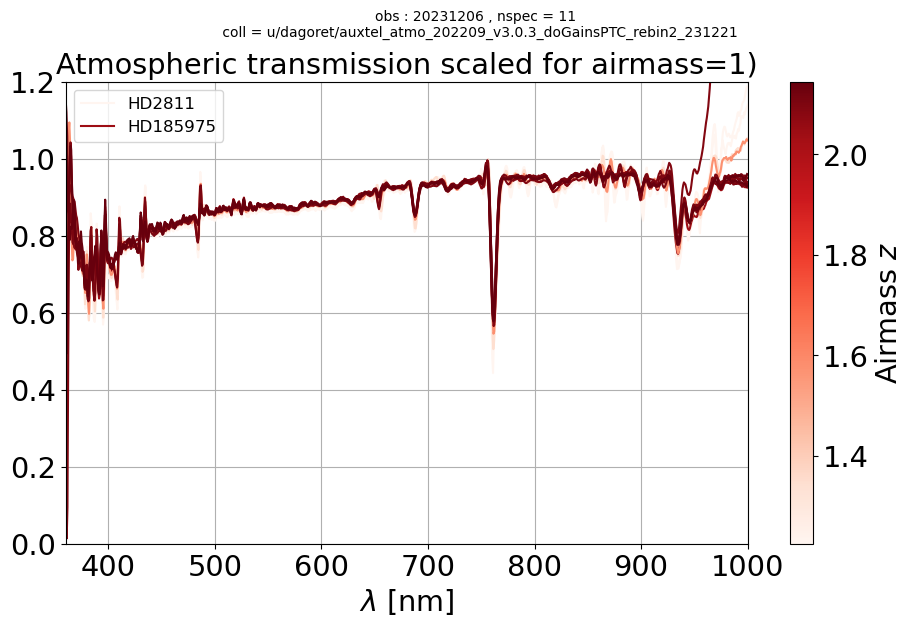

>>> ID.     :  20231207 [2023120700289, 2023120700358, 2023120700366, 2023120700399, 2023120700420, 2023120700421, 2023120700434, 2023120700435]
>>> AIRMASS :  20231207 [1.93094174377831, 1.16839388596346, 1.99681450280567, 1.27878344368903, 1.38806268962779, 1.39323843263595, 1.47569331882934, 1.48188142264463]
                                                id    TARGET      A1_x  \
DATE-OBS                                                                 
2023-12-08 01:01:44.209006145+00:00  2023120700289  HD185975  0.949514   
2023-12-08 02:32:48.268490226+00:00  2023120700358    HD2811  0.976643   
2023-12-08 02:43:11.485505028+00:00  2023120700366  HD185975  0.943156   
2023-12-08 03:14:06.988503349+00:00  2023120700399    HD2811  0.968286   
2023-12-08 03:43:37.521992488+00:00  2023120700420    HD2811  0.965867   
2023-12-08 03:44:50.441503941+00:00  2023120700421    HD2811  0.964335   
2023-12-08 04:02:32.741498325+00:00  2023120700434    HD2811  0.957810   
2023-12-08 04:03:45.

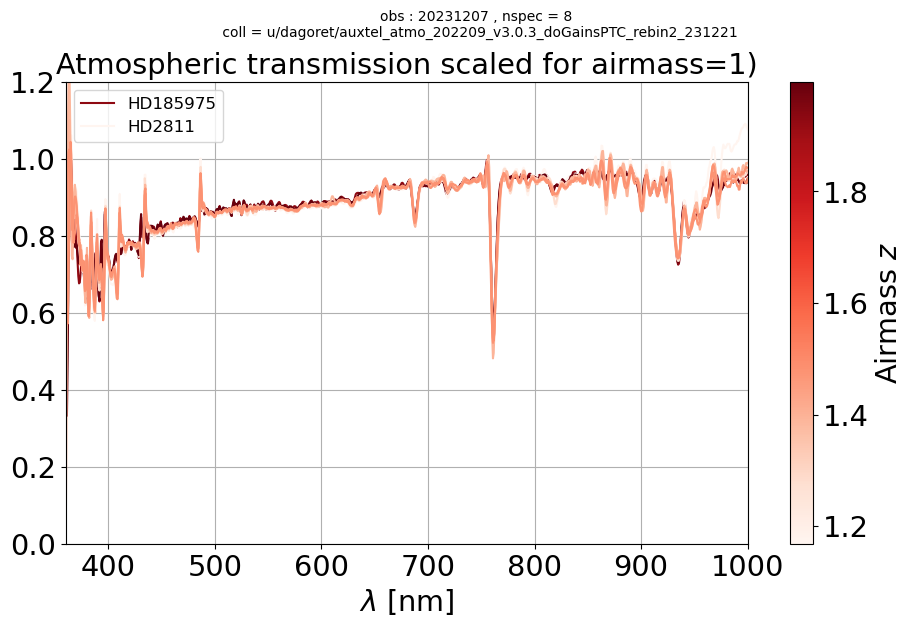

In [62]:
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]

    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    print(df_sel)
    

    if N > 1:
        plot_atmtransmission_zcorr(filtered_spectra, [ spec.airmass for spec in filtered_spectra ],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS )
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")    

## Show with simulation

In [ ]:
allall_meas_atmtransmissions_z1 = []
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]
    
    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    print(df_sel)
    

    if N> 1:
    #                              plot_atmtransmission_zcorr(filtered_spectra, [ spec.airmass for spec in spectra_filtered ],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS )
        all_meas_atmtransmissions_z1 = plot_atmtransmission_zcorr_antatmsim(filtered_spectra, [ spec.airmass for spec in filtered_spectra ],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS )
        allall_meas_atmtransmissions_z1.append(all_meas_atmtransmissions_z1)
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")            

In [ ]:
for idx,filtered_spectra in enumerate(all_filtered_spectra):
    DATEOBS = ALL_DATEOBS[idx]

    # selection of fitted parameters
    selected_ids = [spec.dataId for spec in filtered_spectra]
    cut = (df.id == selected_ids[0])
    N = len(selected_ids)
    for idx in range(1,N):
        cut = cut | (df.id == selected_ids[idx])
    df_sel = df[cut][["id","TARGET","A1_x", "ozone [db]_x", "PWV [mm]_x", "VAOD_x","filtered"]]
    
    print(">>> ID.     : ",DATEOBS, selected_ids)
    print(">>> AIRMASS : ",DATEOBS, [spec.airmass for spec in filtered_spectra])
    print(df_sel)
    

    if N> 1:   
        plot_atmtransmission_zcorr_antatmsim_ratio((filtered_spectra, [ spec.airmass for spec in filtered_spectra ],all_calspecs_sm,tel,disp,collection=my_collection,dateobs=DATEOBS )
    else:
        id = filtered_spectra[0].dataId
        print(f" \n /////// SKIPP {id} \n")            

In [ ]:
print(DATEOBS, [spec.airmass in filtered_spectra])

In [ ]:
all_filtered_spectra[0][0].airmass